 **DISCRETE MODEL VISUALZATIONS**
 
# Decomposed Linear Dynamical Systems (dLDS) for learning the latent components of neural dynamics.

Noga Mudrik$^1$$^2$$^*$, Yenho Chen$^3$$^*$, Eva Yezerets$^1$$^2$, Christopher Rozell$^3$, Adam Charles$^1$$^,$$^2$$^,$$^4$



1. Department of Biomedical Engineering , Johns Hopkins University, Baltimore, MD 21218.
2. Center for Imaging Science, Johns Hopkins University, Baltimore, MD 21218.
3. ML@GT, Georgia Institute of Technology, Atlanta, GA 30308.
4. Kavli Neuroscience Discovery Institute and The Mathematical Institute for Data Science, Johns Hopkins University, Baltimore, MD, USA




 *Equal contribution


Learning interpretable representations of neural dynamics at a population level is
a crucial first step to understanding how neural activity patterns over time relate
to perception and behavior. Models of neural dynamics often focus on either
low-dimensional projections of neural activity, or on learning dynamical systems
that explicitly relate to the neural state over time. We discuss how these two
approaches are interrelated by considering dynamical systems as representative of
flows on a low-dimensional manifold. Building on this concept, we propose a new
decomposed dynamical system model that represents complex nonstationary and
nonlinear dynamics of time-series data as a sparse combination of simpler, more
interpretable components. The decomposed nature of the dynamics generalizes
over previous switched approaches and enables modeling of overlapping and
non-stationary drifts in the dynamics. We further present a dictionary learning-
driven approach to model fitting, where we leverage recent results in tracking sparse
vectors over time. We demonstrate that our model can learn efficient representations
and smoothly transition between dynamical modes in both continuous-time and
discrete-time examples. We show results on low-dimensional linear and nonlinear
attractors to demonstrate that decomposed systems can well approximate nonlinear
dynamics. Additionally, we apply our model to C. elegans data, illustrating a
diversity of dynamics that is obscured when classified into discrete states.

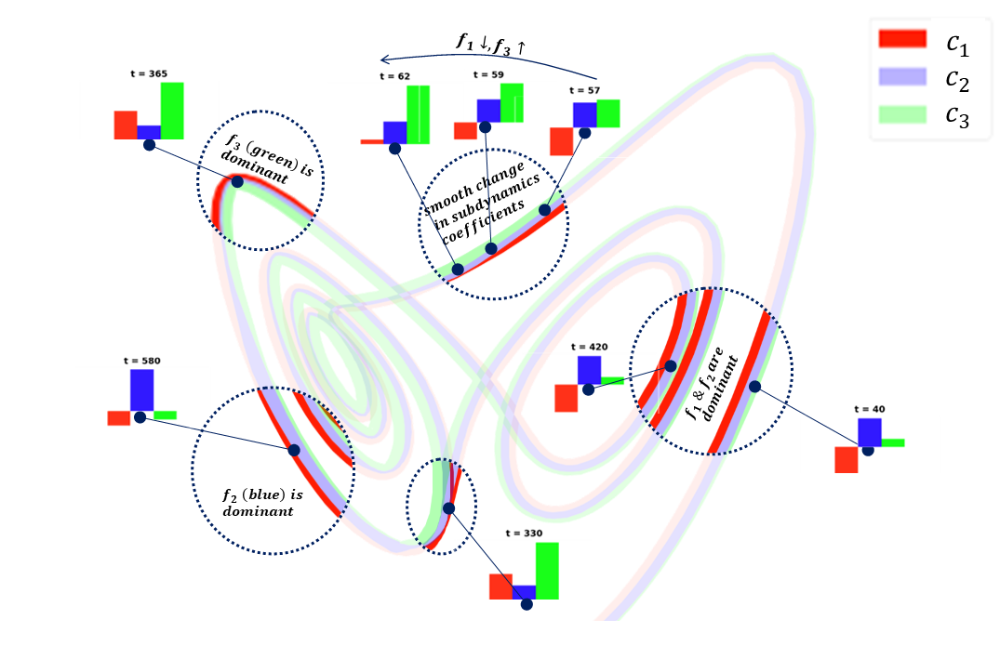

# Outline:

1. **Imports and Packages Installation**
2. **FHN**
    1.   unregularized
    2.   regularized
    3.   regularization effect
    4.   '#' of operators (M) effect

2.	**Lorenz**
    1.   unregularized
    2.   regularized
    3.   comparison the the rSLDS reference [1]
    4.   regularization effect
    5.   '#' of operators (M) effect

3.	***C. elegans***
    1. regularized with 10 transport operators
    2. comparison to rSLDS reference [1]



[1] *Linderman, S., Johnson, M., Miller, A., Adams, R., Blei, D., & Paninski, L. (2017, April). Bayesian learning and inference in recurrent switching linear dynamical systems. In Artificial Intelligence and Statistics (pp. 914-922). PMLR.*   

# Main Model Equations:
\begin{align}
        (1) \space y =   Dx
    \end{align}
    \\
\begin{align}
       (2) \space x_{t+1} = \sum_{m=1}^M c(t)_m f_m x_{t}  
    \end{align}


where 𝓨 ∈ 𝐑 $^{k X T}$ is the observation matrix, 𝒳 ∈ 𝐑 $^{M X T}$ is the latent dynamics, $f_m$ ∈ 𝐑 $^{M X M}$ is the $M^{th}$ discrete transport operator, and $c(t)_m$ is the $M^{th}$ discrete dynamics coefficient at time $t$.

# Imports and packages installation

In [5]:
!pip install webcolors
!pip install mat73
!pip install colormap
!pip install easydev
!pip install pylops


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for colormap: filename=colormap-1.0.4-py3-none-any.whl size=15637 sha256=78e7a046de26e24ebb779e242cdbfcadb37d4068725089560606dd6e3cdd0dda
  Stored in directory: /root/.cache/pip/wheels/71/35/4b/259c328e39ede29b184e4ffe4443bcc2be4e475178a83794c3
Successfully built colormap
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 47 kB 2.3 MB/s 
  Created wheel for easydev: filename=easydev-0.12.0-py3-none-any.whl size=64232 sha256=849105619afbc60fb5c349d3fc254fe7a475967d8d9a17c1089fb40cd7a3a119
  Stored in directory: /root/.cache/pip/wheels/82/ab/83/fdfc4017ea44a585b6754752cc5f63f2d0d63fcc1317e7174b

In [2]:
# clone package repository
import os
try:
  _ = os.listdir("dLDS-Discrete-Python-Model")
except  FileNotFoundError:
  !git clone https://github.com/NogaMudrik/dLDS-Discrete-Python-Model.git



In [6]:
%run  'dLDS-Discrete-Python-Model/dLDS_discrete/dlds_discrete/main_functions.py' 

In [7]:
results_path = 'dLDS-Discrete-Python-Model/discrete_results_notebook/'

# Define Parameters

In [8]:
"""
General Parameters
"""
fsize = 20                                                                                       # general font size for labels, etc.
cmap = 'winter'                                                                                  # which cmap to use
c = ['r','g','b','y','orange','purple', 'salmon','crimson','grey','peru','lawgreen','marron']    # colors to use in different plottings
ls  = ['-','--']                                                                                 # line-style options 
delta_text = 0.1                                                                                 # moving text location


"""
Parameters for FHN
"""

times_plot_fhn =  np.array([ 100, 332,733])                                                      # interesting time points for the FHN case
cmap_f = plt.cm.get_cmap(cmap)                                                                   # cmap to values
colors_plot_c = ['purple','pink']                                                                # coefficients colors for FHN
labels_fhn = ['v','w']                                                                           # labels of FHN case
nerve_states = ['repolarization', 'AP peak', 'hyperpolarization']                                # label for FHN special time points


"""
Lorenz
"""
start_run = 0
factor_power = 0.7
width_des = 1.6
max_time_plot = 530
colors = np.eye(3)
addi =  ' (color by the dominant sub-dynamic)'

# FitzHugh–Nagumo model:
### The FitzHugh–Nagumo model (FHN), is a 2D excitable-oscillatory dynamical system model that describes the temporal behavior of a nerve membrane potential in response to a stimulus [1], and is a simplification of the Hodgkin-Huxley model [2]. The FHN is defined by a pair of conjugated differential equations, denoted by:


\begin{align}
        \frac{dv \, }{dt} =   v - \frac{v^3}{3} - w + I_{ext}
    \end{align}
    \\
\begin{align}
        \tau*\frac{dw \, }{dt} =   v + a - bw
    \end{align}


### where the state-space $(v,w)$ are the nerve membrane potential and the membrane-voltage recovery variables, $I_{ext}$ is an external stimulus, and $\tau$, $a$ and $b$ are model parameters. Here we set $a=0.8$, $b=0.7$, $\tau=20$, and $I_{\textrm{ext}}=0.5$ and shows a sample initialized at $(v_0, w_0) = (-0.5, 0)$. 



\\


[1] *FitzHugh, R. (1961). Impulses and Physiological States in Theoretical Models of Nerve Membrane. Biophysical journal, 1 6, 445-66.*

[2] *HODGKIN, A. L., & HUXLEY, A. F. (1952). A quantitative description of membrane current and its application to conduction and excitation in nerve. The Journal of physiology, 117(4), 500–544. https://doi.org/10.1113/jphysiol.1952.sp004764*

## **Unregularized FHN:**

Loading the FHN results of the dLDS model with 2 dictionary elements and no regularization

In [9]:
file_name =results_path + 'multifhn_2sub0reg.npy'

iter_results = np.load(file_name,allow_pickle=True).item()
F = iter_results['F']
coefficients = iter_results['coefficients']   
latent_dyn = iter_results['latent_dyn']
cur_reco = create_reco(latent_dyn,coefficients, F)

correlation_non_reg_fhn = spec_corr(latent_dyn.flatten(), cur_reco.flatten())

#### The phase-space plot of the FHN model, as reconstructed by our dLDS model (for the unregularized case). 
#### Interesting time points, like repolarization, action potential peak (AP peak), and hyperpolarization, were marked. 

The correlation with ground truth is 1


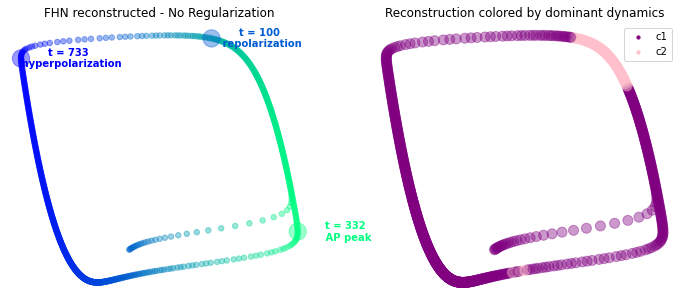

In [10]:
fig, axs =  plt.subplots(1,2,figsize = (12,5))

# Colored by voltage
visualize_dyn(cur_reco, ax = axs[0], params_plot={'title':'FHN reconstructed - No Regularization', 'xlabel':'v','ylabel':'w','title_params' : {'fontsize':fsize}}, color_sig=latent_dyn[0,:], cmap = cmap, marker_size = 30, marker = 'o')

# Colored by dominant dictionary element (c1 - purple, c2 - pink)
visualize_dyn(cur_reco[:,times_plot_fhn], ax = axs[0],  color_sig=cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:])), cmap = cmap, marker_size = 300, marker = 'o')
remove_edges(axs[0])

corr_val = spec_corr(latent_dyn.flatten(),cur_reco.flatten())
print('The correlation with ground truth is %g'%corr_val)

# Add Text in interesting time points
[axs[0].text(latent_dyn[0,t]+7*delta_text, latent_dyn[1,t] , 't = %s \n %s'%(str(t), nerve_states[i]), fontsize = fsize/2, fontweight = 'bold', 
          color = cmap_f(latent_dyn[0,t]/np.max(latent_dyn[0,:])) ,horizontalalignment='center',  verticalalignment='center') for i,t in enumerate(times_plot_fhn)];

visualize_dyn(cur_reco, coefficients=coefficients, color_by_dominant=True, colors_dyns=np.array(colors_plot_c), marker_size = 100, ax = axs[1],
              legend =['c1','c2'] , params_plot = {'title':'Reconstruction colored by dominant dynamics','xlabel':'v','ylabel':'w'})


#### Plot the dynamics' coefficients space (space spanned by $c(t)_i$) for the unregularized case

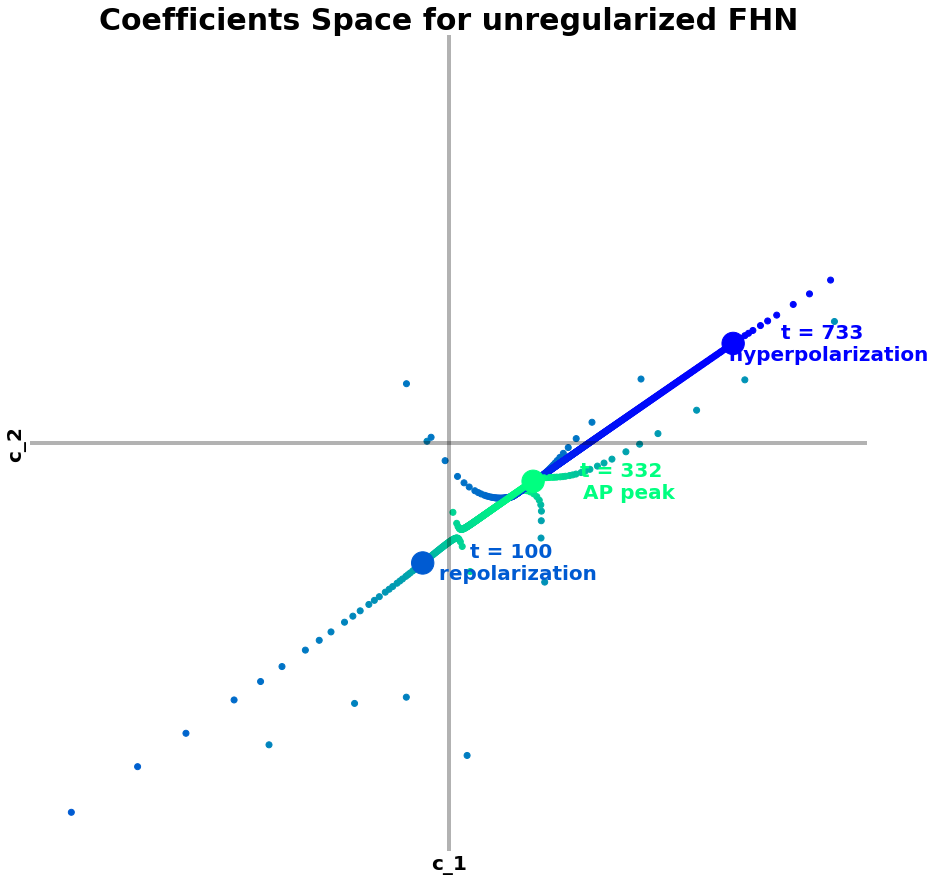

In [ ]:
# Create Figure
fig, axs =  plt.subplots(figsize = (15,15))

h = axs.scatter(coefficients[0,:], coefficients[1,:], c = latent_dyn[0,:-1], cmap = cmap)

# Add Text
[axs.text(coefficients[0,t]+55*delta_text, coefficients[1,t] , 't = %s \n %s'%(str(t), nerve_states[i]), fontsize = fsize, fontweight = 'bold', 
          color = cmap_f(latent_dyn[0,t]/np.max(latent_dyn[0,:])) ,horizontalalignment='center',  verticalalignment='center') for i,t in enumerate(times_plot_fhn)]
h2 = axs.scatter(coefficients[0,times_plot_fhn], coefficients[1,times_plot_fhn],  c =cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:])),s = 500 )

# Add labels and title
amx = 25
add_labels(axs,zlabel = None, xlim = [-amx,amx], ylim = [-amx/4,amx/4], ylabel_params={'fontsize': fsize, 'fontweight':'bold'}, ylabel = 'c_2',
           xlabel_params={'fontsize': fsize, 'fontweight':'bold'}, xlabel = 'c_1',
           title_params={'fontsize': fsize*1.5, 'fontweight':'bold'}, title = 'Coefficients Space for unregularized FHN')

# Add axis
axs.axhline(0, color = 'black', alpha = 0.3, lw = 4)
axs.axvline(0, color = 'black', alpha = 0.3, lw = 4)
remove_edges(axs)




### Plot the coefficients and the voltage 
#### The time-evolution of the coefficients and their relation to the voltage in each time point can facilitate modeling and understanding of the FHN dynamics.

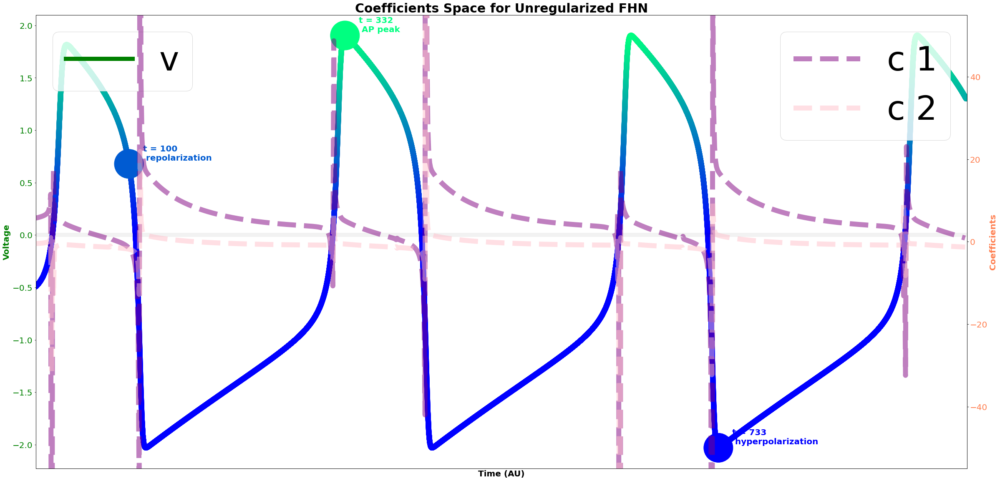

In [ ]:
interp_v = np.interp(np.arange(0,latent_dyn.shape[1], 0.01), np.arange(latent_dyn.shape[1]), latent_dyn[0,:])
fig,ax = plt.subplots(figsize = (40,20))

ax.plot([0,1.1*coefficients.shape[1]],[0,0], lw = 10, alpha = 0.05, color = 'black')
ax2 = ax.twinx()

[ax2.plot(coefficients[i,:], lw = 12, ls = ls[1],label = 'c %s'%str(i+1), color = colors_plot_c[i], alpha = 0.5) for i in range(coefficients.shape[0])]
ax2.legend( loc = 'upper right', prop={'size': 80})

# Plot v + interesting time points
ax.scatter(np.arange(0,latent_dyn.shape[1], 0.01), interp_v, s = 150, c = cmap_f(interp_v / np.max(interp_v)))
ax.scatter(times_plot_fhn, latent_dyn[0,times_plot_fhn],c = cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:])), s = 4900)
ax.plot([],[],color = 'green',lw = 10,  label = 'v')
ax.legend(loc = 'upper left',prop={'size': 80})
ax.tick_params(axis='y', labelcolor = 'green')
plt.yticks(fontsize =fsize)
ax.tick_params(axis='y', labelsize=fsize,  labelcolor = 'green')
ax2.tick_params(axis='y', labelsize=fsize,  labelcolor = 'coral')
ax.set_xticks([])
ax2.set_xticks([])

# Add Labels 
add_labels(ax,zlabel = None, xlim = [0,1000],  ylabel_params={ 'color' :'green', 'fontsize' :fsize, 'fontweight' : 'bold'}, ylabel = 'Voltage',
           xlabel_params={'fontsize' : fsize, 'fontweight' : 'bold'}, xlabel = 'Time (AU)', title_params={'fontsize': fsize*1.5, 'fontweight':'bold'},
           title = 'Coefficients Space for Unregularized FHN')
add_labels(ax2,zlabel = None, xlabel = None, ylabel_params={ 'color' :'coral', 'fontsize' :fsize, 'fontweight' : 'bold'}, ylabel = 'Coefficients', ylim = [-55,55])

# Add Text
[ax.text(t+15,latent_dyn[0,t]+delta_text , 't = %s \n %s'%(str(t), nerve_states[i]), fontsize = fsize, fontweight = 'bold', 
          color = cmap_f(latent_dyn[0,t]/np.max(latent_dyn[0,:])) ,horizontalalignment='left',  verticalalignment='center') for i,t in enumerate(times_plot_fhn)];

#### Streamplots of the reconstructed dynamics (∑$f_m$ * $c(t)_m$) in the interesting time points (t = 100, t = 332, t = 733)
#### Our model was able to form several unique linear dynamics which underlie the nerve membrane dynamics in distinct phases during the action potential. 

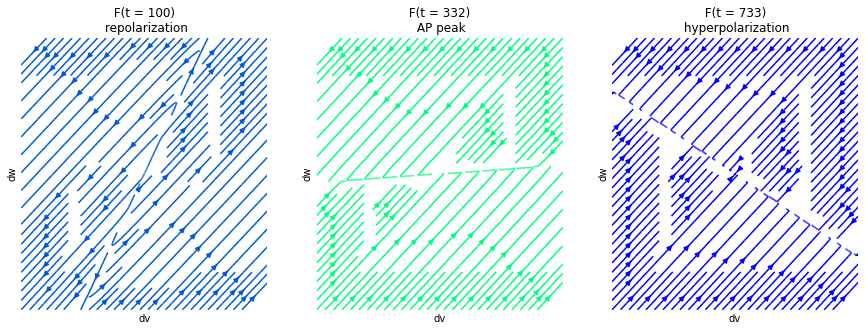

In [ ]:
colors_vals_t = cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:]))
fig,axs = plt.subplots(1,len(times_plot_fhn), figsize = (5*len(times_plot_fhn),5))
[plot_reco_dyn(coefficients, F, t, type_plot = 'streamplot',color = colors_vals_t[i,:-1] , cons_color=True, ax = axs[i]) for i,t in enumerate(times_plot_fhn)]
 
[remove_edges(ax) for ax in axs]    
[add_labels(ax = ax, xlabel = 'dv',ylabel = 'dw',zlabel = None, title =' F(t = %g) \n %s'%(times_plot_fhn[i], nerve_states[i]) ) for i,ax in enumerate(axs)];


### Visualzation of the dictionary elements' (sub-dynamics) effects. 
#### Each row is a different sub-dynamic ($f_i$). The left column descriibes the sub-dynamic eigenvalue; the mid-column describes the effect of the sub-dynamic on a 2d square; the right column is a streamplot of the sub-dynamic (in the area where x $\in$ [-5,5] & y $\in$ [-5,5] ).

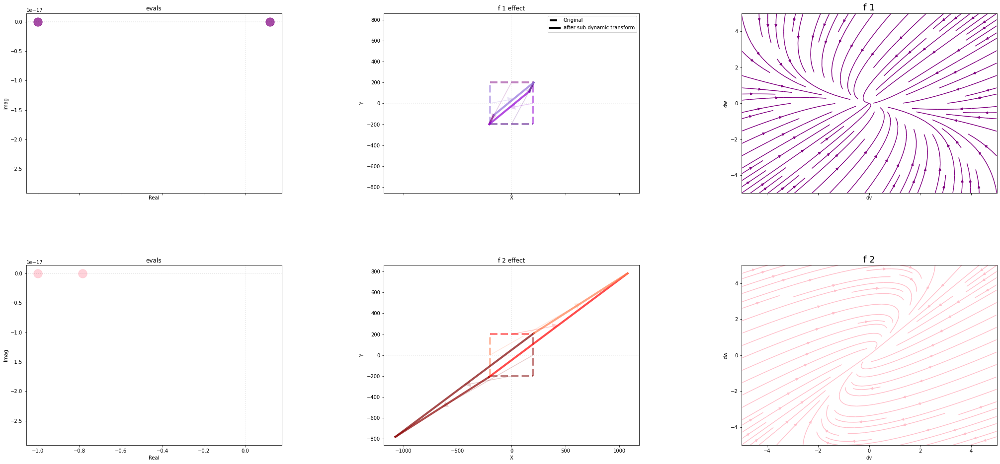

In [ ]:
plot_subs_effects_2d(F, colors =[['purple','indigo','darkviolet','mediumpurple'],['r','maroon','darkred','coral']], evec_colors = colors_plot_c, rec_rad_all =200, loc_leg = 'upper right',axs = axs,fig = fig, include_dyn=True)


# Regularized FHN 
### SPGL1 solver, τ = 0.3

In [ ]:
# Upload the regularized FHN results, with tau = 0.3

file_name =  results_path +r'/FHN_with_reg_0_3_spgl1.npy'

iter_results = np.load(file_name,allow_pickle=True).item()
F = iter_results['F']
coefficients = iter_results['coefficients']   
latent_dyn = iter_results['latent_dyn']
cur_reco = create_reco(latent_dyn,coefficients, F)


#### The phase-space plot of the FHN model, as reconstructed by our dLDS model (for the regularized case)

The correlation with ground truth is 1


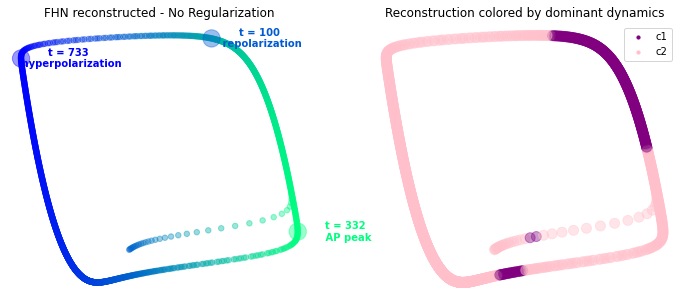

In [ ]:
# Plot recontruction

fig, axs =  plt.subplots(1,2,figsize = (12,5))

# Reconstruction colored by voltage
visualize_dyn(cur_reco, ax = axs[0], params_plot={'title':'FHN reconstructed - No Regularization', 'xlabel':'v','ylabel':'w','title_params' : {'fontsize':fsize}}, color_sig=latent_dyn[0,:], cmap = cmap, marker_size = 30, marker = 'o')

# Reconstruction colored by dominant dictionary element
visualize_dyn(cur_reco[:,times_plot_fhn], ax = axs[0],  color_sig=cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:])), cmap = cmap, marker_size = 300, marker = 'o')
remove_edges(axs[0])
corr_val = spec_corr(latent_dyn.flatten(),cur_reco.flatten())
print('The correlation with ground truth is %g'%corr_val)

# Add Text
[axs[0].text(latent_dyn[0,t]+7*delta_text, latent_dyn[1,t] , 't = %s \n %s'%(str(t), nerve_states[i]), fontsize = fsize/2, fontweight = 'bold', 
          color = cmap_f(latent_dyn[0,t]/np.max(latent_dyn[0,:])) ,horizontalalignment='center',  verticalalignment='center') for i,t in enumerate(times_plot_fhn)];

visualize_dyn(cur_reco, coefficients=coefficients, color_by_dominant=True, colors_dyns=np.array(colors_plot_c), marker_size = 100, ax = axs[1],
              legend =['c1','c2'] , params_plot = {'title':'Reconstruction colored by dominant dynamics','xlabel':'v','ylabel':'w'})





### Plot the dynamics' coefficients space (space spanned by $c(t)_i$) for the regularized case. 
 Running dLDS with and without $\ell_1$ sparsity regularization can affect the interpretability of the system. Specifically, sparsity enables ${c(t)}_i$ to adhere to the axes (figure below), showing how the FHN model oscillates between positive and negative motions using the learned two dynamics. The slight correction, smooth transitions, and motion using the same dynamics in both forward and reverse directions cannot be captured by switched systems. 

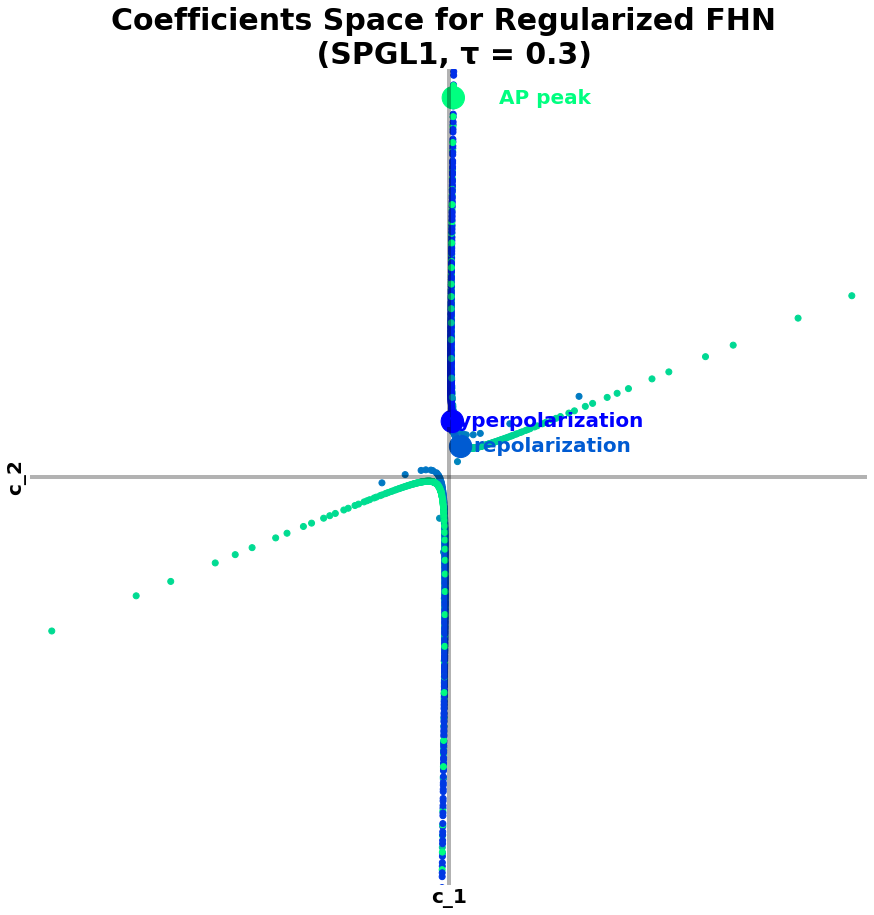

In [ ]:
# Create Figure
fig, axs =  plt.subplots(figsize = (15,15))
h = axs.scatter(coefficients[0,:], coefficients[1,:], c = latent_dyn[0,:-1], cmap = cmap)

# Add Text
[axs.text(coefficients[0,t]+55*delta_text, coefficients[1,t] , '%s'%(nerve_states[i]), fontsize = fsize, fontweight = 'bold', 
          color = cmap_f(latent_dyn[0,t]/np.max(latent_dyn[0,:])) ,horizontalalignment='center',  verticalalignment='center') for i,t in enumerate(times_plot_fhn)]
h2 = axs.scatter(coefficients[0,times_plot_fhn], coefficients[1,times_plot_fhn],  c =cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:])),s = 500 )

# Add labels and title
amx = 25
add_labels(axs,zlabel = None, xlim = [-amx,amx], ylim = [-amx/4,amx/4], ylabel_params={'fontsize': fsize, 'fontweight':'bold'}, ylabel = 'c_2',
           xlabel_params={'fontsize': fsize, 'fontweight':'bold'}, xlabel = 'c_1',
           title_params={'fontsize': fsize*1.5, 'fontweight':'bold'}, title = 'Coefficients Space for Regularized FHN \n (SPGL1, \u03C4 = 0.3)')

# Add axis
axs.axhline(0, color = 'black', alpha = 0.3, lw = 4)
axs.axvline(0, color = 'black', alpha = 0.3, lw = 4)
remove_edges(axs)



The temporal evolution of the membrane voltage (blue-green) and of the dynamics coefficients. Three points of interest include the repolarization ($t=100$), the AP peak ($t=332$), and hyper-polarization ($t = 733$). 

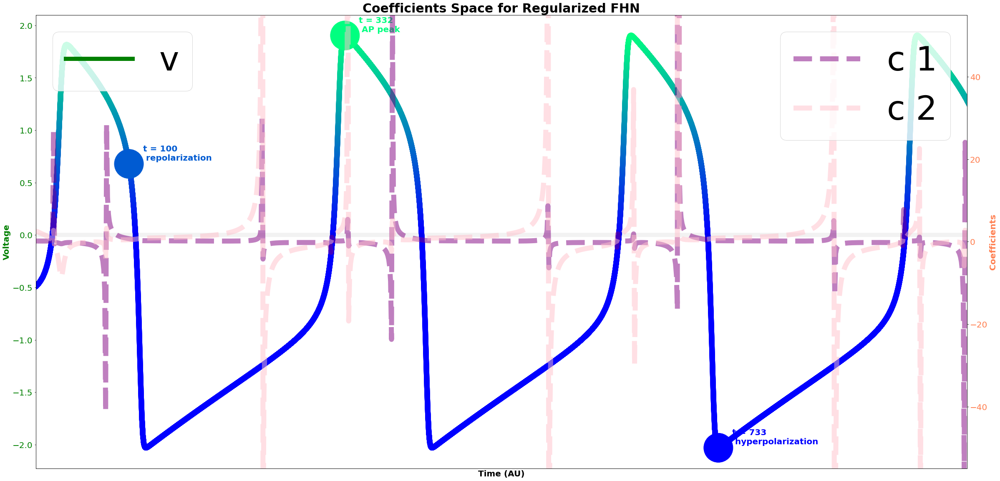

In [ ]:
interp_v = np.interp(np.arange(0,latent_dyn.shape[1], 0.01), np.arange(latent_dyn.shape[1]), latent_dyn[0,:])
fig,ax = plt.subplots(figsize = (40,20))

ax.plot([0,1.1*coefficients.shape[1]],[0,0], lw = 10, alpha = 0.05, color = 'black')
ax2 = ax.twinx()

[ax2.plot(coefficients[i,:], lw = 12, ls = ls[1],label = 'c %s'%str(i+1), color = colors_plot_c[i], alpha = 0.5) for i in range(coefficients.shape[0])]
ax2.legend( loc = 'upper right', prop={'size': 80})


ax.scatter(np.arange(0,latent_dyn.shape[1], 0.01), interp_v, s = 150, c = cmap_f(interp_v / np.max(interp_v)))
ax.scatter(times_plot_fhn, latent_dyn[0,times_plot_fhn],c = cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:])), s = 4900)


ax.plot([],[],color = 'green',lw = 10,  label = 'v')
ax.legend(loc = 'upper left',prop={'size': 80})
ax.tick_params(axis='y', labelcolor = 'green')
plt.yticks(fontsize =fsize)
ax.tick_params(axis='y', labelsize=fsize,  labelcolor = 'green')
ax2.tick_params(axis='y', labelsize=fsize,  labelcolor = 'coral')
ax.set_xticks([])
ax2.set_xticks([])

add_labels(ax,zlabel = None, xlim = [0,1000],  ylabel_params={ 'color' :'green', 'fontsize' :fsize, 'fontweight' : 'bold'}, ylabel = 'Voltage',
           xlabel_params={'fontsize' : fsize, 'fontweight' : 'bold'}, xlabel = 'Time (AU)', title_params={'fontsize': fsize*1.5, 'fontweight':'bold'},
           title = 'Coefficients Space for Regularized FHN')
add_labels(ax2,zlabel = None, xlabel = None, ylabel_params={ 'color' :'coral', 'fontsize' :fsize, 'fontweight' : 'bold'}, ylabel = 'Coefficients', ylim = [-55,55])

# Add Text
[ax.text(t+15,latent_dyn[0,t]+delta_text , 't = %s \n %s'%(str(t), nerve_states[i]), fontsize = fsize, fontweight = 'bold', 
          color = cmap_f(latent_dyn[0,t]/np.max(latent_dyn[0,:])) ,horizontalalignment='left',  verticalalignment='center') for i,t in enumerate(times_plot_fhn)];

#### Streamplots of the reconstructed dynamics (∑$f_m$ * $c(t)_m$) in the interesting time points (t = 100, t = 332, t = 733), for the regularized FHN case.

#### We show that dLDS is capable of representing more distinct reconstructed dynamics (3 unique reconstructed linear dynamics) than the number of learned operators {$f_i$}, (m = 2) , by combining dictionary elements through continuous and opposite-sign coefficients, a concept unavailable to SLDS. 

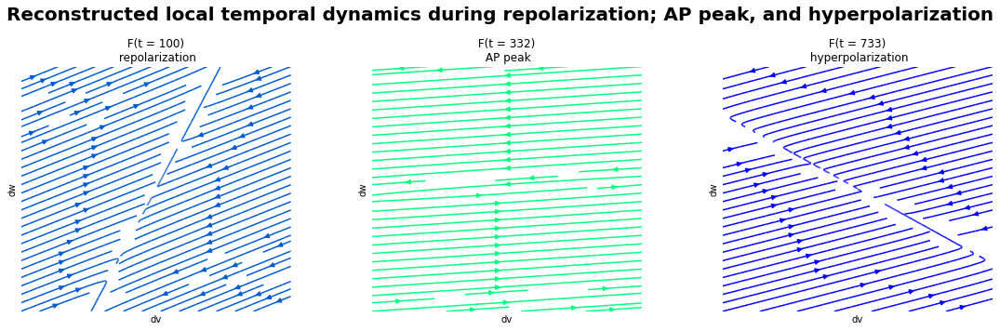

In [ ]:
colors_vals_t = cmap_f(latent_dyn[0,times_plot_fhn]/np.max(latent_dyn[0,:]))
fig,axs = plt.subplots(1,len(times_plot_fhn), figsize = (5*len(times_plot_fhn),5))
[plot_reco_dyn(coefficients, F, t, type_plot = 'streamplot',color = colors_vals_t[i,:-1] , cons_color=True, ax = axs[i]) for i,t in enumerate(times_plot_fhn)]
 
[remove_edges(ax) for ax in axs]    
[add_labels(ax = ax, xlabel = 'dv',ylabel = 'dw',zlabel = None, title =' F(t = %g) \n %s'%(times_plot_fhn[i], nerve_states[i]) ) for i,ax in enumerate(axs)];
fig.suptitle('Reconstructed local temporal dynamics during repolarization; AP peak, and hyperpolarization', fontsize = fsize, fontweight = 'bold');
fig.tight_layout()
fig.subplots_adjust(top=0.8, wspace=0.3)

#### Visualzation of the dictionary elements' (sub-dynamics) effects

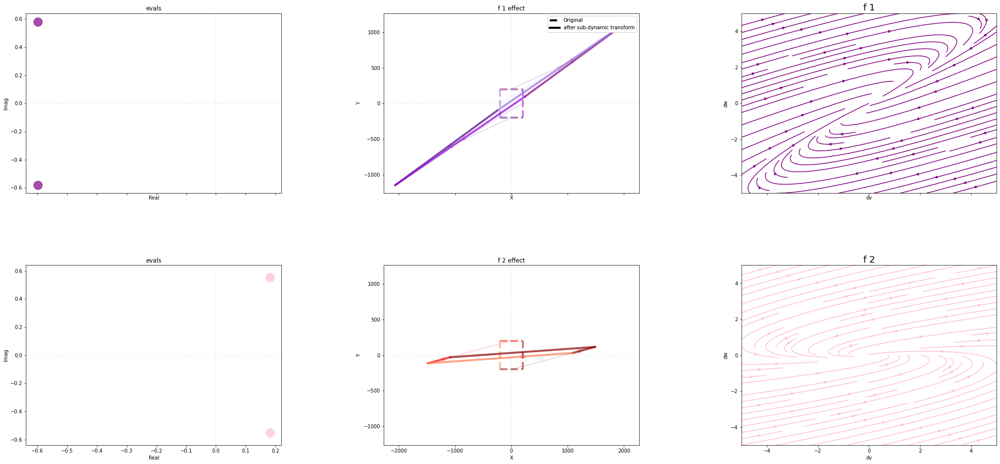

In [ ]:
plot_subs_effects_2d(F, colors =[['purple','indigo','darkviolet','mediumpurple'],['r','maroon','darkred','coral']], evec_colors = colors_plot_c, rec_rad_all =200, loc_leg = 'upper right',axs = axs,fig = fig, include_dyn=True)


# Regularization effect for FHN 
#### Modulate the model sparse regularization effect.
#### $\tau$ of the SPGL1 solver ranges between 0 to 0.7 (τ ∈ [0, 0.01, 0.05, 0.1, 0.4, 0.6, 0.7])



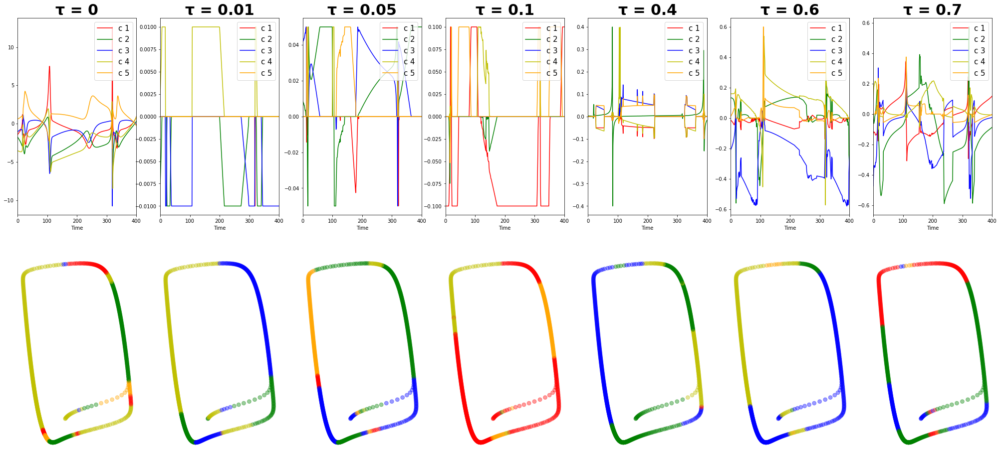

In [ ]:
num_sub_parh = results_path +r'/fhn_reg_effect'  # Path name

max_dyplay = 400                                            # Maximum time to display
num_regs = [0,0.01,0.05,0.1,0.4,0.6,0.7]                    # regularization options to display
fig,axs = plt.subplots(2,len(num_regs), figsize = (35,16))  # initialize a figure
axs0 = axs[0,:] 
axs1 = axs[1,:]

for sub_n, sub in enumerate(num_regs):                      # iterate over regularizations
    file_name = num_sub_parh + r'/fhn_5sub%sregspgl1_iters10.npy'%str(sub).replace('.','_') # load file
    iter_results = np.load(file_name,allow_pickle=True).item()                              
    F = iter_results['F']
    coefficients = iter_results['coefficients']   
    latent_dyn = iter_results['latent_dyn']
    cur_reco = create_reco(latent_dyn,coefficients, F)                                                                     # create reconstruction nmnmnm

    [axs0[sub_n].plot(coefficients[i,:], c=c[i]) for i in range(coefficients.shape[0])]                                    # plot coefficients over time
    axs0[sub_n].legend(['c %g'%(i+1) for i in range(coefficients.shape[0])] ,loc = 'upper right',prop = {'size':15})       # legend
    visualize_dyn(latent_dyn, coefficients=coefficients, color_by_dominant=True, colors_dyns=np.array(c), marker_size = 60,ax = axs1[sub_n]) # visualize dynamics colored by the cominant operator
    axs0[sub_n].set_title('τ = %g'%sub, fontsize = 30, fontweight = 'bold')
    axs0[sub_n].set_xlim([0,max_dyplay])
    axs0[sub_n].set_xlabel('Time')
    axs1[sub_n].set_ylabel('Coefficients')
    axs1[sub_n].set_xlabel('v')
    axs1[sub_n].set_ylabel('w')

# FHN: modulating the # of dictionary elements ($f_i$)  
#### $M$ (number of dictionary elements) ranges between 2 to 7 (M ∈ [2, 3, 4, 5, 6, 7])

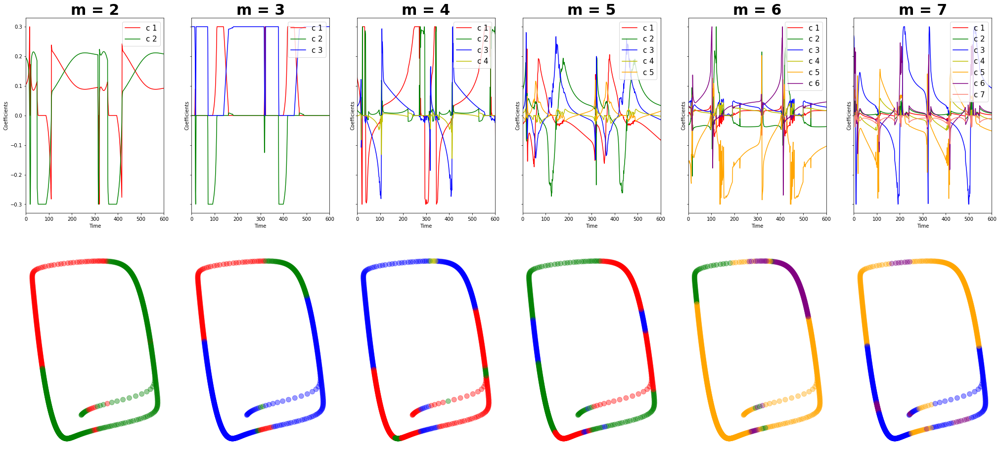

In [ ]:
num_sub_parh = results_path  + r'/num_sub_fhn'
max_dyplay = 600
num_subs = [2,3,4,5,6,7]
fig,axs = plt.subplots(2,len(num_subs), figsize = (35,16),sharey = 'row')
for sub_n, sub in enumerate(num_subs):
    file_name = num_sub_parh + r'/fhn_%gsub0_3regspgl1_iters10.npy'%sub
    iter_results = np.load(file_name,allow_pickle=True).item()
    F = iter_results['F']
    coefficients = iter_results['coefficients']   
    latent_dyn = iter_results['latent_dyn']
    cur_reco = create_reco(latent_dyn,coefficients, F)
    [axs[0,sub_n].plot(coefficients[i,:], c=c[i]) for i in range(coefficients.shape[0])]
    axs[0,sub_n].legend(['c %g'%(i+1) for i in range(coefficients.shape[0])] ,loc = 'upper right',prop = {'size':15})
    #visualize_dyn(cur_reco, ), 
    visualize_dyn(latent_dyn, coefficients=coefficients, color_by_dominant=True, colors_dyns=np.array(c), marker_size = 100,ax = axs[1,sub_n])
    axs[0,sub_n].set_title('m = %g'%sub, fontsize = 30, fontweight = 'bold')
    axs[0,sub_n].set_xlim([0,max_dyplay])
    axs[0,sub_n].set_xlabel('Time')
    axs[0,sub_n].set_ylabel('Coefficients')
    axs[1,sub_n].set_xlabel('v')
    axs[1,sub_n].set_ylabel('w')

# **Lorenz Attractor Results:**
### Similar to the FHN, the Lorenz attractor is a nonlinear attractor, governed by:
\\



\begin{align}
        \frac{dx\, }{dt} = α(y-x) 
    \end{align}
    \\
\begin{align}
        \frac{dy\, }{dt} =  x(β - z) - y
    \end{align} 
    \\
\begin{align}
        \frac{dz\, }{dt} = xy - βz
    \end{align}

\\
### dLDS was able to reconstruct the Lorenz attractor to high accuracy.






## Unregularized Lorenz

In [ ]:
file_name = results_path  + r'/multilorenz_3sub0reg.npy'  # file name
iter_results = np.load(file_name,allow_pickle=True).item()         # load file
F = iter_results['F']
coefficients = iter_results['coefficients']   
latent_dyn = iter_results['latent_dyn']
cur_reco = create_reco(latent_dyn,coefficients, F)

#### Below are plots of the x-z and y-z projections of the Lorenz reconstruction for the unregularized case. The relative weights of the different dictionary elements are expressed by the different widths of the relevant colors, each color represent a different dictionary element. 


#### Learning three dynamical systems to approximate the Lorenz attractor motion reveals that dLDS can track smoothly changing dynamics by titrating the contributions of separate dynamical systems. We note that even in the case where the values of $c(t)_i$ are not regularized e.g., data in this plot, different dynamics become more or less dominant over different areas within the attractor.




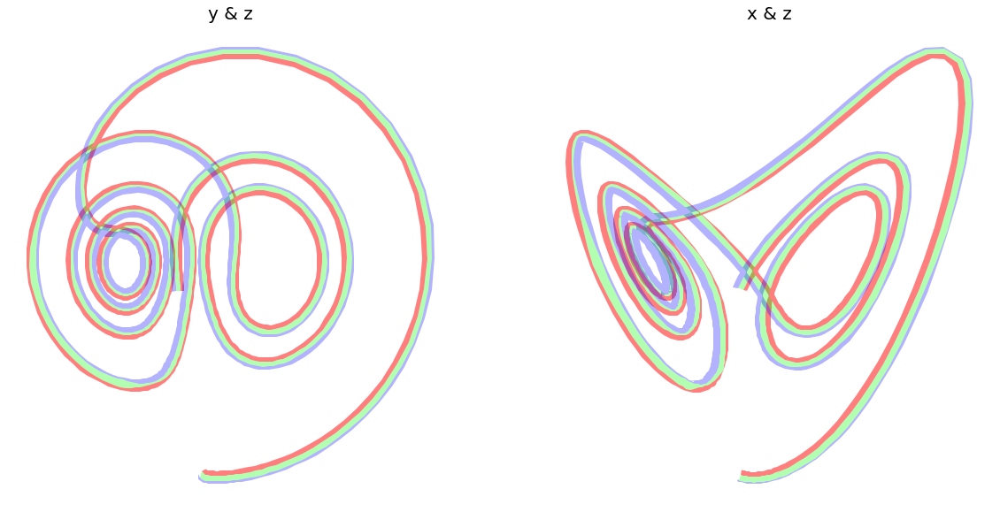

In [ ]:
fig, axs = plt.subplots(1,2,figsize = (20,10))

store_dict , coefficients_n = calculate_high_for_all(coefficients[: ,start_run:], choose_meth = 'intersection',width_des = width_des, latent_dyn = cur_reco[[1,2],start_run:],direction_initial= 'low',factor_power = 0.7, return_unchose=True, type_norm='abs', same_width = False, min_width = 0.15)
plot_multi_colors(store_dict, colors = colors, ax = axs[0], alpha = 0.5,coefficients_n=coefficients_n, factor_power= factor_power, max_time_plot = max_time_plot , to_scatter_only_one= False, to_scatter = False, smooth_window =17, min_time_plot = 0, title = 'y & z')#colors = ['black','black','black'], 


store_dict , coefficients_n = calculate_high_for_all(coefficients[: ,start_run:], choose_meth = 'intersection',width_des = width_des, latent_dyn = cur_reco[[0,2],start_run:],direction_initial= 'low',factor_power = 0.7, return_unchose=True, type_norm='abs', same_width = False, min_width = 0.01)
plot_multi_colors(store_dict, colors = colors, ax = axs[1], alpha = 0.5,coefficients_n=coefficients_n, factor_power= factor_power, max_time_plot = max_time_plot , to_scatter_only_one= False, to_scatter = False, smooth_window =17, min_time_plot = 0, title = 'x & z')#colors = ['black','black','black'], 



Lorenz reconstruction, colored by time

Text(0, 0.5, 'Time (AU)')

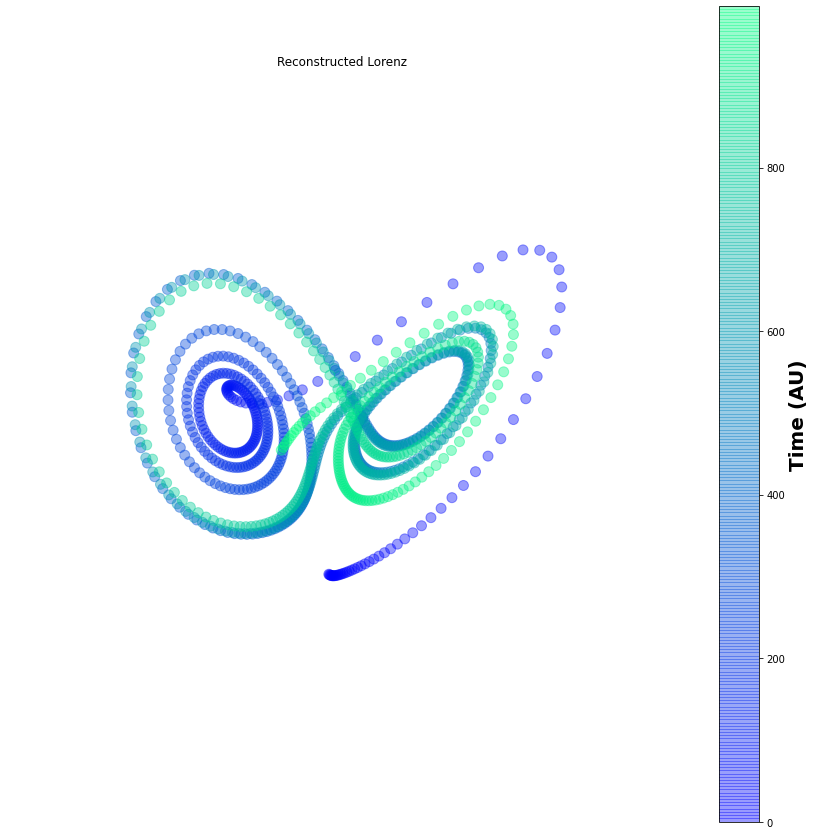

In [ ]:
fig, axs =  plt.subplots(figsize = (15,15),subplot_kw={'projection':'3d'})
h = visualize_dyn(cur_reco[:,:-1], ax = axs, params_plot={'title':'Reconstructed Lorenz', 'title_params':{'fontsize':fsize}}, cmap = cmap,marker_size = 100,return_mappable=True)#, color_sig = coefficients[0,:])#color_by_dominant=True, coefficients=coefficients)

cbar = fig.colorbar(h)
cbar.ax.set_ylabel('Time (AU)', rotation =90, fontsize = fsize, fontweight = 'bold') #


### Heatmaps of dictionary elements ($f_i$)  for the unregularized Lorenz

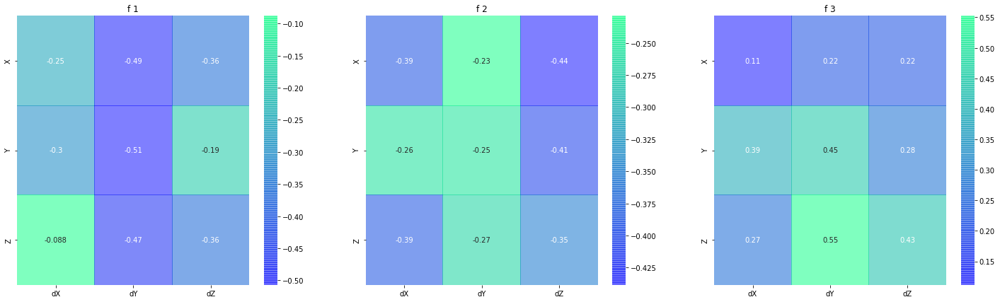

In [ ]:
fig,axs = plt.subplots(1,len(F),figsize = (25,7))
[sns.heatmap(f,annot = True,ax = axs[i],cmap= cmap,alpha = 0.5) for i,f in enumerate(F)]
[ax.set_title('f %s'%str(i+1)) for i , ax in enumerate(axs)];
[ax.set_xticklabels(['dX','dY','dZ']) for ax in axs];
[ax.set_yticklabels(['X','Y','Z']) for ax in axs];

### Dictionary elements effects for the unregularized Lorenz

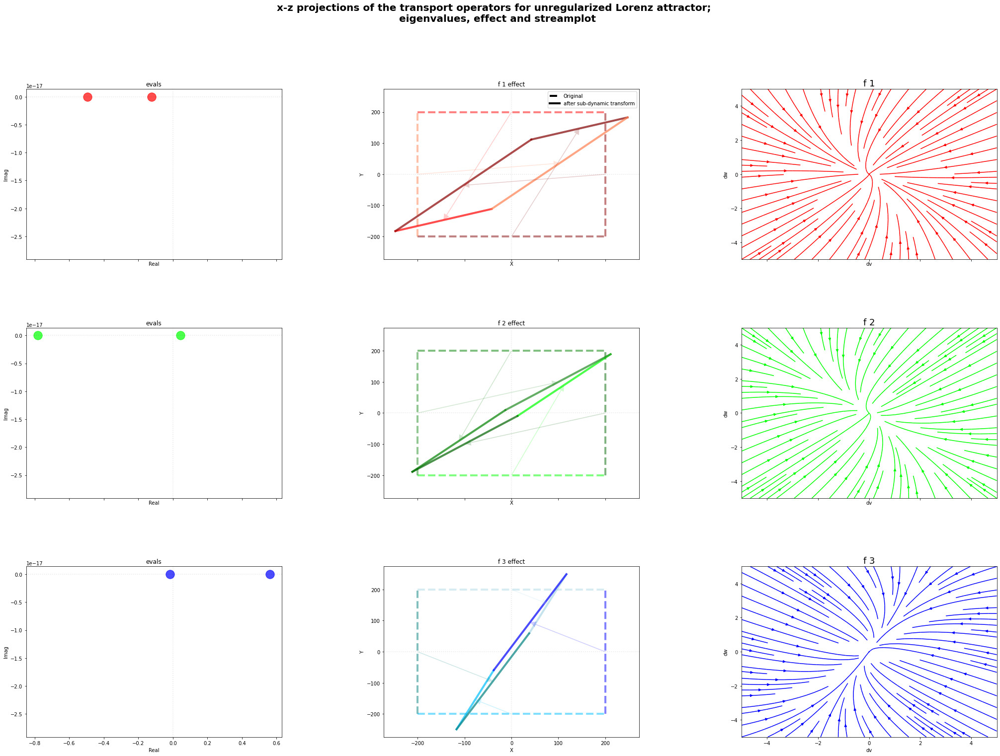

In [ ]:

projection = [0,2]
F_n = [f[:,projection] for f in F]
F_n = [f[projection, :] for f in F_n]
plot_subs_effects_2d(F_n, colors =[['r','maroon','darkred','coral'],['green','lime','darkgreen','forestgreen'],['lightblue','deepskyblue','blue','teal']], 
                     evec_colors =colors, rec_rad_all =200, loc_leg = 'upper right',axs = axs,fig = fig, include_dyn=True)

plt.suptitle('x-z projections of the transport operators for unregularized Lorenz attractor; \n eigenvalues, effect and streamplot', fontsize = fsize, fontweight = 'bold');
fig.tight_layout()
fig.subplots_adjust(top=0.8, wspace=0.3)


### Ground Truth vs Reconstructed


Text(0.5, 1.0, 'Ground Truth')

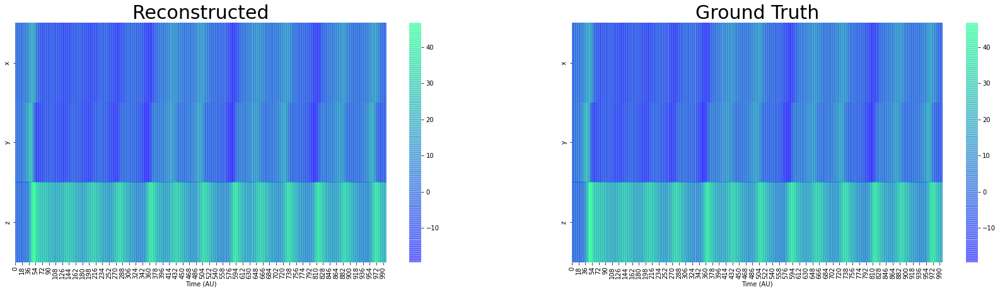

In [ ]:
fig,axs = plt.subplots(1,2, figsize = (29,7))
sns.heatmap(cur_reco, ax = axs[0], alpha = 0.4, cmap = cmap)
sns.heatmap(latent_dyn, ax = axs[1], alpha = 0.4, cmap = cmap)

fig.subplots_adjust()
[ax.set_xlabel('Time (AU)') for ax in axs]
[ax.set_yticklabels(['x','y','z']) for ax in axs]
axs[0].set_title('Reconstructed', fontsize = fsize * 1.5)
axs[1].set_title('Ground Truth', fontsize = fsize * 1.5)



### Space spanned by the coefficients, for the unregularized Lorenz

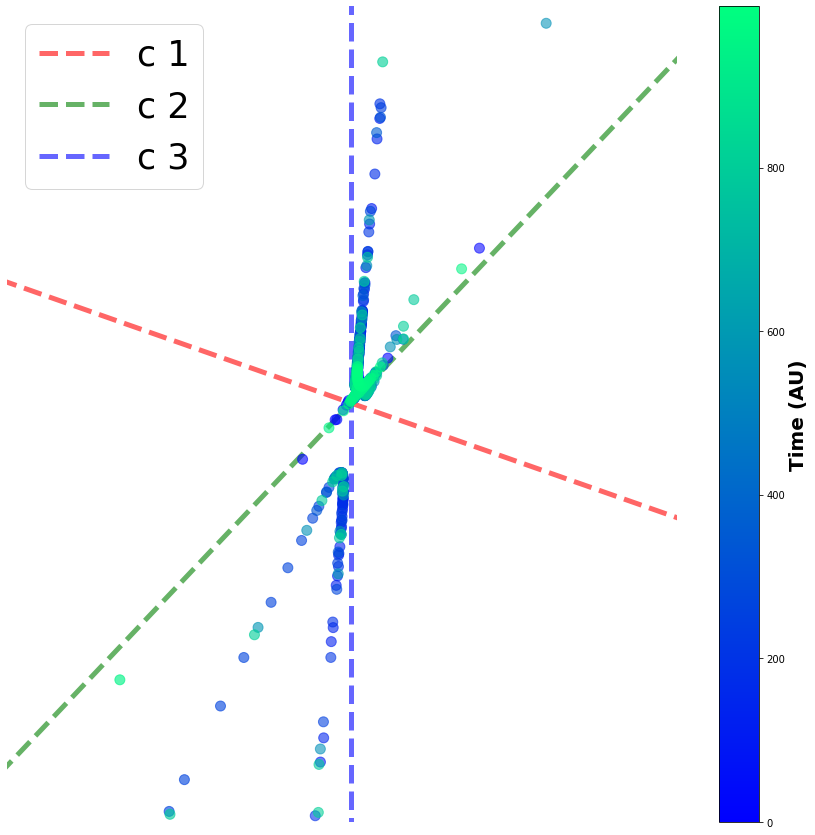

In [ ]:
fig, axs =  plt.subplots(figsize = (15,15),subplot_kw={'projection':'3d'})

h = axs.scatter(coefficients_n[0,:], coefficients[1,:], coefficients[2,:], c = np.arange(coefficients.shape[1]), cmap = cmap, s = 100)
zax = np.arange(coefficients.shape[1])
lims = 50
axs.set_xlim([-lims,lims])
axs.set_ylim([-lims,lims])
axs.set_zlim([-lims,lims])
cbar = fig.colorbar(h)
cbar.ax.set_ylabel('Time (AU)', rotation =90, fontsize = fsize, fontweight = 'bold')
axs.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.grid(False)
axs.set_axis_off()
axs.plot([np.min(coefficients[0,:]),np.nanmax(coefficients[0,:])],[0,0],[0,0], color = c[0], ls = '--', alpha = 0.6, lw = 5, label = 'c 1')
axs.plot([0,0],[np.min(coefficients[1,:]),np.max(coefficients[1,:])],[0,0], color = c[1], ls = '--', alpha = 0.6,lw = 5, label = 'c 2')

axs.plot([0,0],[0,0],[np.min(coefficients[2,:]),np.nanmax(coefficients[2,:])], color = c[2], ls = '--', alpha = 0.6, lw = 5, label = 'c 3')
axs.legend(prop = {'size': 35})

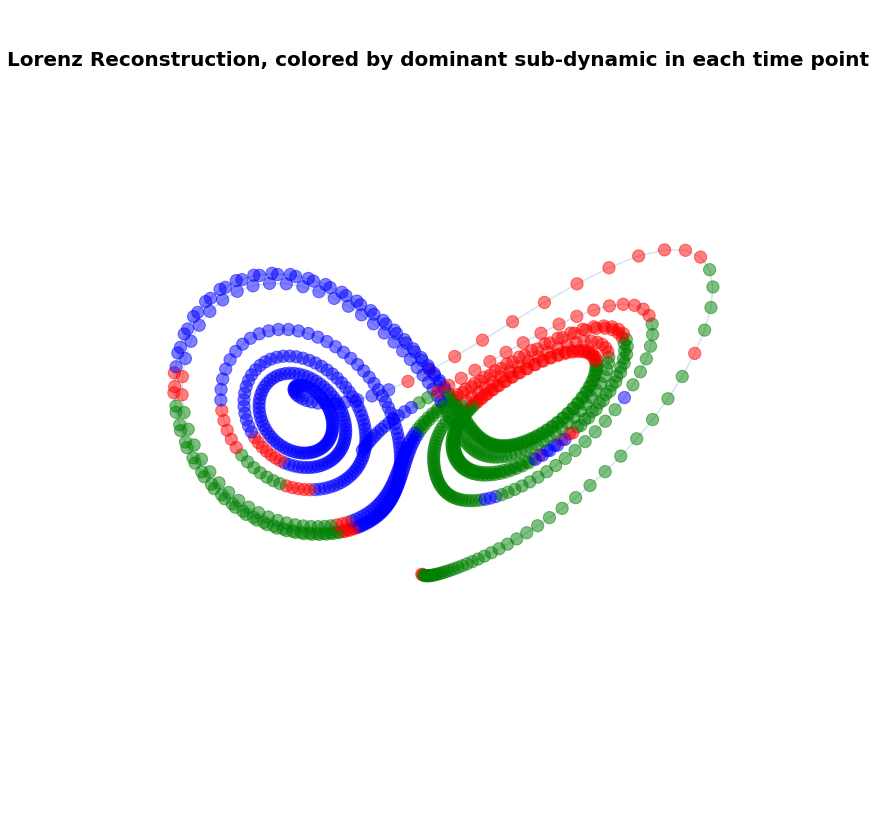

In [ ]:
fig, ax = plt.subplots(subplot_kw={'projection':'3d'}, figsize = (15,15)) 
visualize_dyn(cur_reco,ax = ax, coefficients = np.abs(coefficients) , color_mix=  False, color_by_dominant=True, colors = c, include_line=True , figsize = (12,12), marker_size = 150, alpha = 0.5, colors_dyns = np.array(c))
ax.set_title('Lorenz Reconstruction, colored by dominant sub-dynamic in each time point', fontsize =fsize , fontweight= 'bold');

# Regularized Lorenz -


*   5 sub-dynamics
*   $\tau$ = 0.55

In [ ]:
file_name = results_path  + r'/lorenz_5sub0_55regspgl1_iters10.npy'  # file name
iter_results = np.load(file_name,allow_pickle=True).item()                    # load file
F = iter_results['F']
coefficients = iter_results['coefficients']   
latent_dyn = iter_results['latent_dyn']
cur_reco = create_reco(latent_dyn,coefficients, F)

### Reconstructed Lorenz (regularized version), colored by time

Text(0, 0.5, 'Time (AU)')

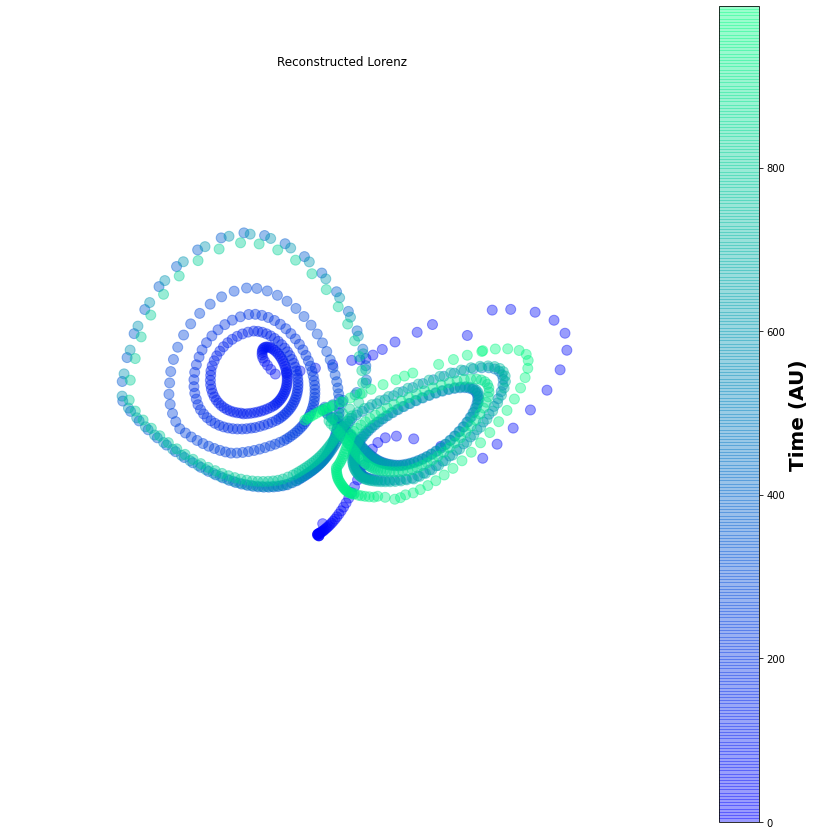

In [ ]:
fig, axs =  plt.subplots(figsize = (15,15),subplot_kw={'projection':'3d'})
h = visualize_dyn(cur_reco[:,:-1], ax = axs, params_plot={'title':'Reconstructed Lorenz', 'title_params':{'fontsize':fsize}}, cmap = cmap,marker_size = 100,return_mappable=True)#, color_sig = coefficients[0,:])#color_by_dominant=True, coefficients=coefficients)

cbar = fig.colorbar(h)
cbar.ax.set_ylabel('Time (AU)', rotation =90, fontsize = fsize, fontweight = 'bold')


### Regularized Lorenz sub-dynamic heatmaps

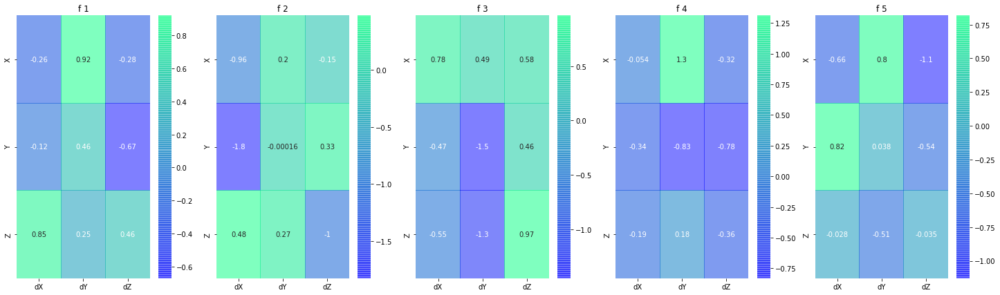

In [ ]:
fig,axs = plt.subplots(1,len(F),figsize = (25,7))
[sns.heatmap(f,annot = True,ax = axs[i],cmap= cmap,alpha = 0.5) for i,f in enumerate(F)]
[ax.set_title('f %s'%str(i+1)) for i , ax in enumerate(axs)];
[ax.set_xticklabels(['dX','dY','dZ']) for ax in axs];
[ax.set_yticklabels(['X','Y','Z']) for ax in axs];

Effects of the dictionary operators (x-z projection)

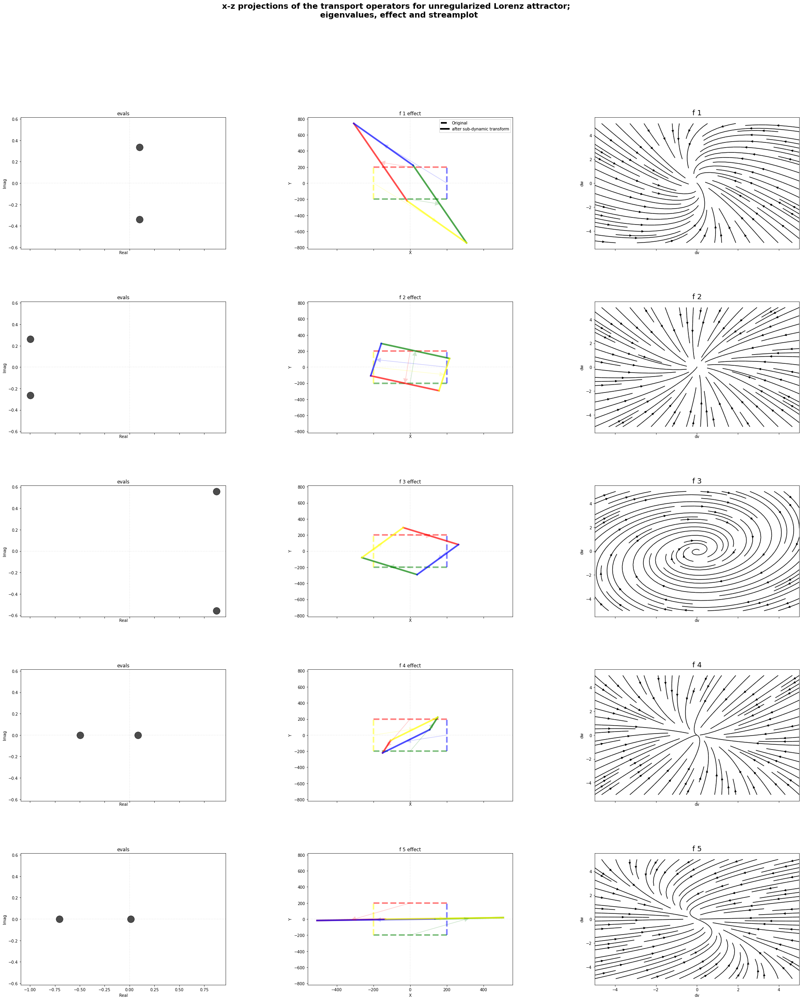

In [ ]:
projection = [0,2]
F_n = [f[:,projection] for f in F]
F_n = [f[projection, :] for f in F_n]
plot_subs_effects_2d(F_n, colors =['r','g','b','yellow'], 
                     evec_colors =['black']*len(F), rec_rad_all =200, loc_leg = 'upper right',axs = axs,fig = fig, include_dyn=True)

plt.suptitle('x-z projections of the transport operators for unregularized Lorenz attractor; \n eigenvalues, effect and streamplot', fontsize = fsize, fontweight = 'bold');
fig.tight_layout()
fig.subplots_adjust(top=0.8, wspace=0.3)


Compare reconstructed dynamics to ground truth

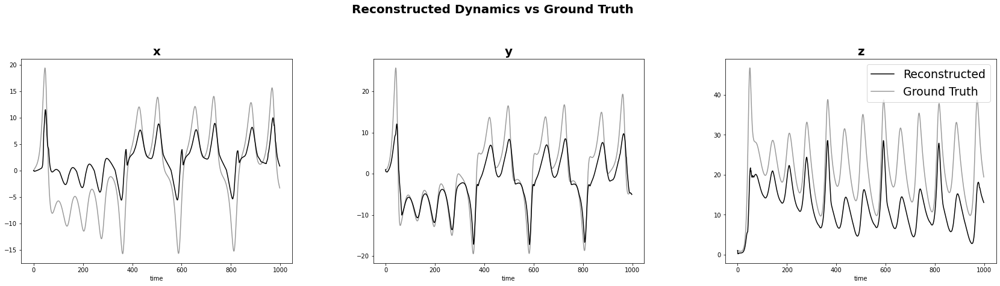

In [ ]:
fig,axs = plt.subplots(1,3, figsize = (29,7))
[axs[k].plot(cur_reco[k,:],color = 'black') for k in np.arange(3)]
[axs[k].plot(latent_dyn[k,:],color = 'black',alpha = 0.4) for k in np.arange(3)]
fig.subplots_adjust()
ax_names = ['x','y','z']
[ax.set_xlabel('time') for ax in axs]
[ax.set_title(ax_names[i], fontsize = 20, fontweight = 'bold') for i , ax in enumerate(axs)]
axs[-1].legend(['Reconstructed', 'Ground Truth'], prop= {'size':19})
plt.suptitle('Reconstructed Dynamics vs Ground Truth', fontsize =fsize,fontweight= 'bold')
fig.subplots_adjust(top=0.8, wspace=0.3)

Lorenz reconstruction, colored by the most dominant dictionary element (highest absolute value)
- left: Including the bias basis dynamics (in green)
- right: Exceluding the bias basis dynamics, except for regions in which it is the only one active. 

[Text(0.5, 0.8464, 'Recontruction colored by most dominant dynamics'),
 Text(0.5, 0.8464, 'Recontruction colored by most dominant dictionary element \n excluding "background" dynamics')]

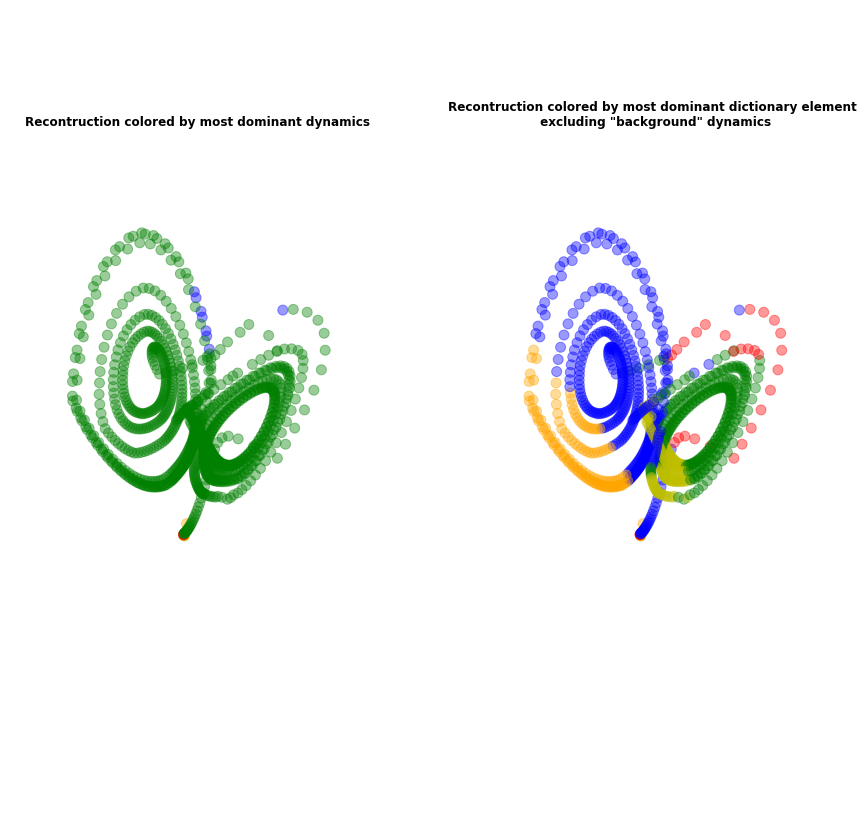

In [ ]:
fig, axs =  plt.subplots(1,2,figsize = (15,15),subplot_kw={'projection':'3d'})
coeff_0 = coefficients.copy()
coeff_0[1,:] =0

visualize_dyn(cur_reco, ax = axs[0], params_plot={'title':'reconstructed'},color_by_dominant=True,coefficients=np.abs(coefficients),colors_dyns = np.array(c), marker_size = 100, color_for_0 = c[1])
coeff_0[1,:] =0
cur_reco_0 = create_reco(latent_dyn,coeff_0, F)
visualize_dyn(cur_reco, ax = axs[1], params_plot={'title':'reconstructed'},color_by_dominant=True,coefficients=np.abs(coeff_0),colors_dyns = np.array(c), marker_size = 100, color_for_0 = c[1])

titles = ['Recontruction colored by most dominant dynamics','Recontruction colored by most dominant dictionary element \n excluding "background" dynamics']
[ax.set_title(titles[i], fontweight = 'bold') for i, ax in enumerate(axs)]

# Coefficients over time for the regularized Lorenz case

(0.0, 998.0)

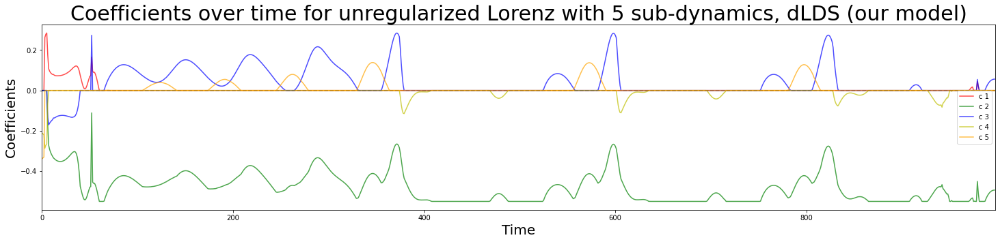

In [ ]:
plt.figure(figsize = (25,5))

[plt.plot(coefficients[i,:], c = c[i],alpha = 0.7) for i in range(coefficients.shape[0])]
plt.axhline(0, color = 'black', ls ='--', alpha = 0.2)
plt.xlabel('Time', fontsize = fsize)
plt.legend(['c %g'%(i+1) for i in range(len(F))]);
plt.ylabel('Coefficients', fontsize = fsize)
plt.title('Coefficients over time for unregularized Lorenz with 5 sub-dynamics, dLDS (our model)', fontsize = fsize * 1.5);
plt.xlim([0, coefficients.shape[1]])


The dynamics' coefficients space. Here the coefficients lied closer to the axes, compared to the unregularized version.

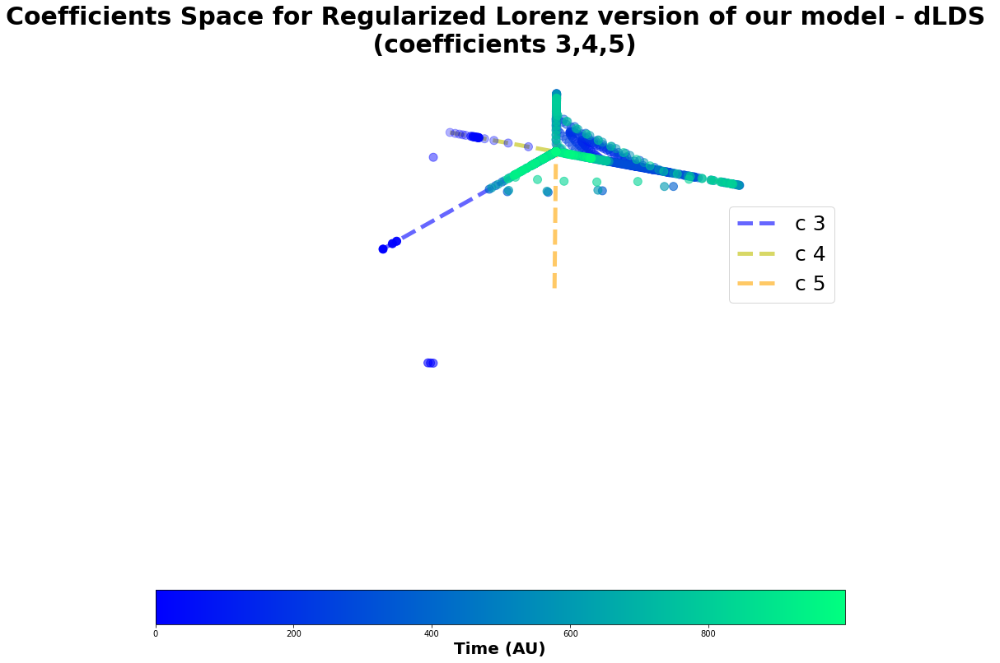

In [ ]:
fig, axs =  plt.subplots(figsize = (15,15),subplot_kw={'projection':'3d'})
coefficients_n = coefficients[[2,3,4], :]
h = axs.scatter(coefficients_n[0,:], coefficients_n[1,:], coefficients_n[2,:], c = np.arange(coefficients_n.shape[1]), cmap = cmap, s = 100)
zax = np.arange(coefficients_n.shape[1])

cbar = fig.colorbar(h,aspect=20, orientation="horizontal")
axs.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.grid(False)
axs.set_axis_off()
axs.plot([0,0],[np.min(coefficients_n[1,:]),np.max(coefficients_n[1,:])],[0,0], color = c[2], ls = '--', alpha = 0.6,lw = 5,label = 'c 3')
axs.plot([np.min(coefficients_n[0,:]),np.nanmax(coefficients_n[0,:])],[0,0],[0,0], color = c[3], ls = '--', alpha = 0.6, lw = 5, label = 'c 4')
axs.plot([0,0],[0,0],[np.min(coefficients_n[2,:]),np.nanmax(coefficients_n[2,:])], color = c[4], ls = '--', alpha = 0.6, lw = 5, label = 'c 5')

axs.legend(prop = {'size':25},loc = 'center right')
cbar.ax.set_xlabel('Time (AU)', rotation =0, fontsize = fsize, fontweight = 'bold')
add_labels(axs,zlabel = 'c 5', zlabel_params={'fontsize': fsize, 'fontweight':'bold'},
           ylabel_params={'fontsize': fsize, 'fontweight':'bold'}, ylabel = 'c 4',
           xlabel_params={'fontsize': fsize, 'fontweight':'bold'}, xlabel = 'c 3',
           title_params={'fontsize': fsize*1.5, 'fontweight':'bold'}, title = 'Coefficients Space for Regularized Lorenz version of our model - dLDS \n (coefficients 3,4,5)')

### Compare Lorenz to rSLDS

In [ ]:
with open(results_path  + r'/lorenz_5sub0reg_results.pkl', 'rb') as f:    results = pickle.load(f)
F = list(results['As'])
latent_dyn = results['xhat'].T
b = results['bs']
coefficients = results['zhat'].T
cur_reco = np.vstack([np.sum(np.dstack( [coefficients[i,t] * F[i] for i in range(len(F))] ),2) @ latent_dyn[:,t] + b.T @ coefficients[:,t] for t in np.arange(latent_dyn.shape[1])]).T


Plot the reference (rsLDS) reconstruction, colored by the active operator in each time point

Text(0.5, 0.92, 'Reconstruction Results for the Reference, rSLDS \n colored by the dominant dynamics at each time point')

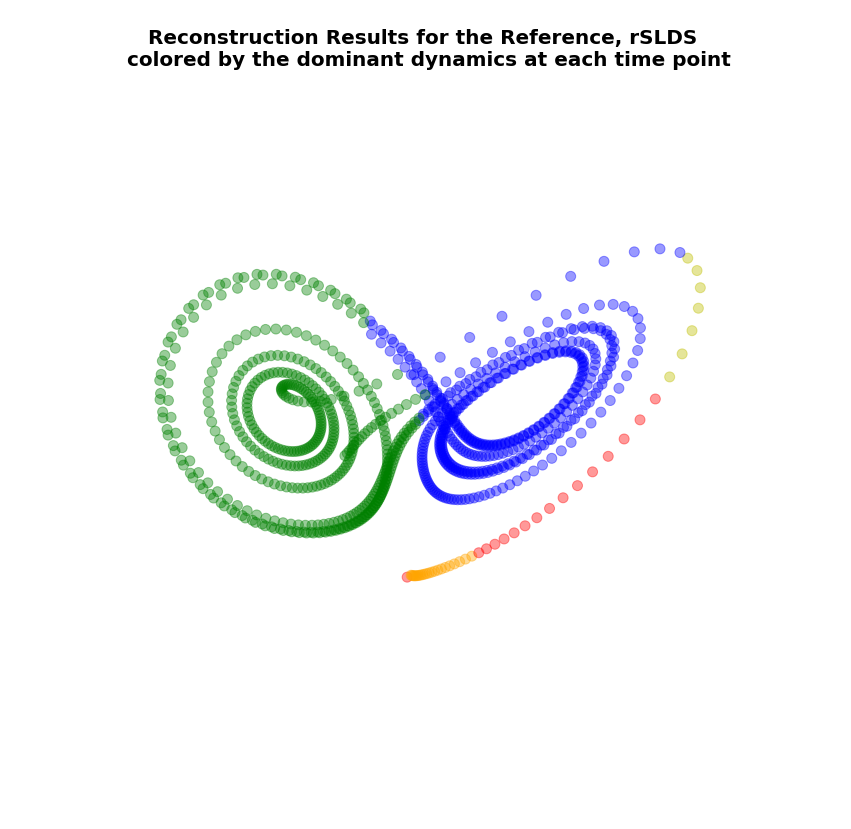

In [ ]:
fig, ax = plt.subplots(figsize = (15,15),subplot_kw={'projection':'3d'})
visualize_dyn(cur_reco, coefficients=coefficients, color_by_dominant=True, ax = ax, colors_dyns=np.array(c), marker_size = 100)
ax.set_title('Reconstruction Results for the Reference, rSLDS \n colored by the dominant dynamics at each time point', fontsize = fsize, fontweight = 'bold')

Plot coefficient of the reference over time

Text(0.5, 1.0, 'Coefficients over time for non-regularized Lorenz with 5 sub-dynamics, rSLDS (reference)')

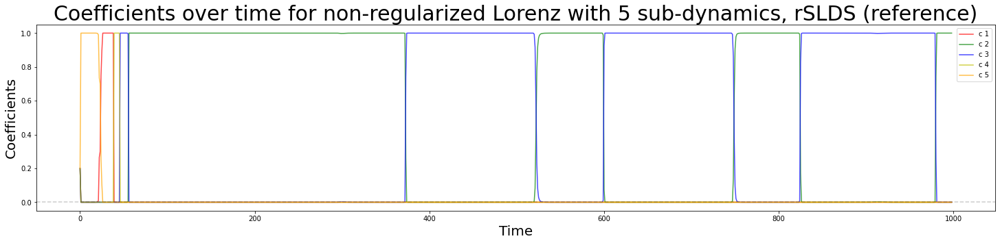

In [ ]:
plt.figure(figsize = (25,5))
[plt.plot(coefficients[i,:], c = c[i],alpha = 0.7) for i in range(coefficients.shape[0])]
plt.axhline(0, color = 'black', ls ='--', alpha = 0.2)
plt.xlabel('Time', fontsize = fsize)
plt.legend(['c %g'%(i+1) for i in range(len(F))]);
plt.ylabel('Coefficients', fontsize = fsize)
plt.title('Coefficients over time for non-regularized Lorenz with 5 sub-dynamics, rSLDS (reference)', fontsize = fsize * 1.5)


Plot the coefficients' space for the reference (rsLDS). Compared to our model, both the regularized and the un-regularized version, the reference's (rsLDS) coefficients are restricted to the axes.

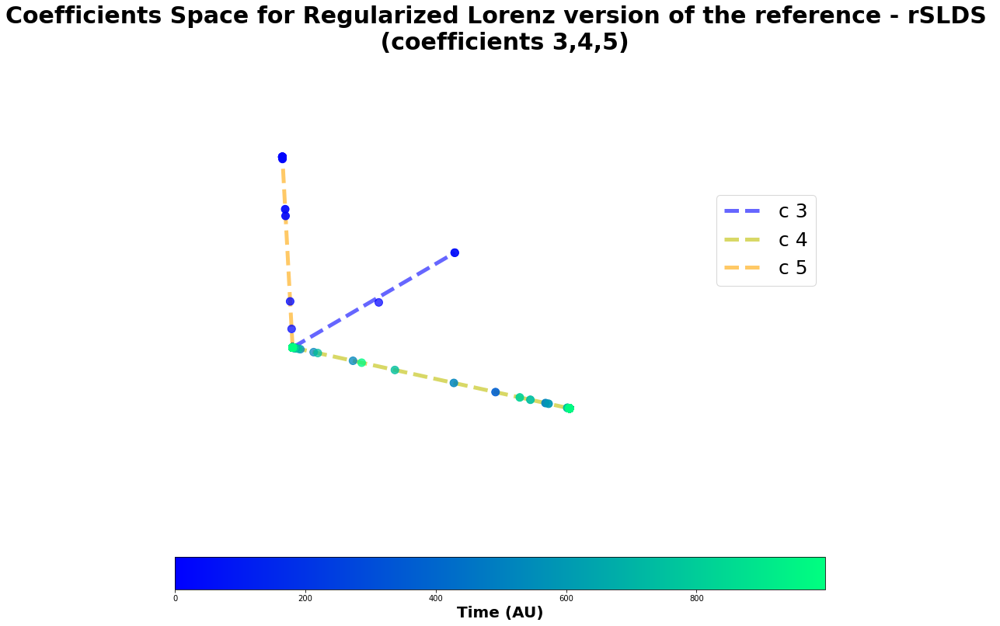

In [ ]:
fig, axs =  plt.subplots(figsize = (15,15),subplot_kw={'projection':'3d'})
coefficients_n = coefficients[[2,3,4], :]
h = axs.scatter(coefficients_n[0,:], coefficients_n[1,:], coefficients_n[2,:], c = np.arange(coefficients_n.shape[1]), cmap = cmap, s = 100)
zax = np.arange(coefficients_n.shape[1])

cbar = fig.colorbar(h,aspect=20, orientation="horizontal")
axs.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs.grid(False)
axs.set_axis_off()
axs.plot([0,0],[np.min(coefficients_n[1,:]),np.max(coefficients_n[1,:])],[0,0], color = c[2], ls = '--', alpha = 0.6,lw = 5,label = 'c 3')
axs.plot([np.min(coefficients_n[0,:]),np.nanmax(coefficients_n[0,:])],[0,0],[0,0], color = c[3], ls = '--', alpha = 0.6, lw = 5, label = 'c 4')
axs.plot([0,0],[0,0],[np.min(coefficients_n[2,:]),np.nanmax(coefficients_n[2,:])], color = c[4], ls = '--', alpha = 0.6, lw = 5, label = 'c 5')

axs.legend(prop = {'size':25},loc = 'center right')
cbar.ax.set_xlabel('Time (AU)', rotation =0, fontsize = fsize, fontweight = 'bold')
add_labels(axs,zlabel = 'c 5', zlabel_params={'fontsize': fsize, 'fontweight':'bold'},
           ylabel_params={'fontsize': fsize, 'fontweight':'bold'}, ylabel = 'c 4',
           xlabel_params={'fontsize': fsize, 'fontweight':'bold'}, xlabel = 'c 3',
           title_params={'fontsize': fsize*1.5, 'fontweight':'bold'}, title = 'Coefficients Space for Regularized Lorenz version of the reference - rSLDS \n (coefficients 3,4,5)')


# Regularization effect for Lorenz
#### - $\tau$ ranges between 0 to 0.7
#### - M is fixed to 5

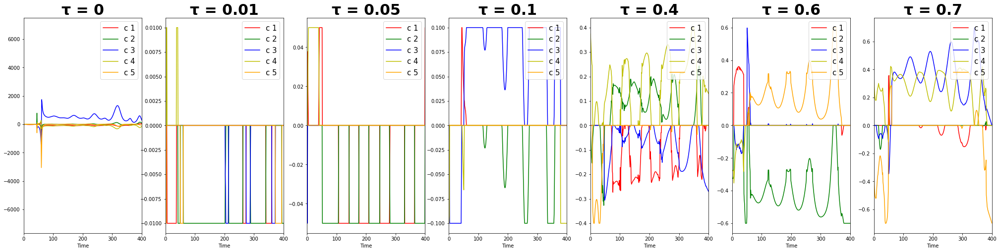

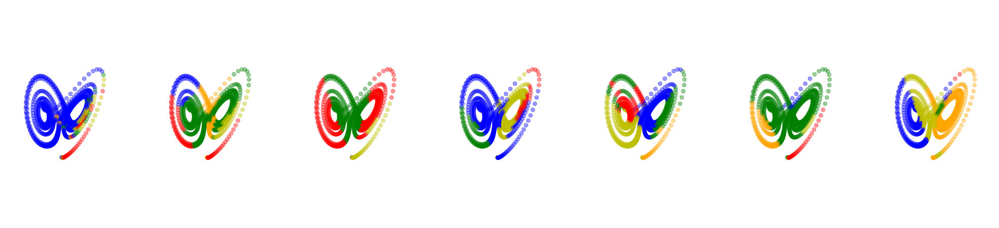

In [ ]:
num_sub_parh = results_path  + r'/lorenz_reg_effect'                                                 # path name

max_dyplay = 400                                                                                              # maximum time to display
num_regs = [0,0.01,0.05,0.1,0.4,0.6,0.7]                                                                      # options for '\tau' of the SPGL1 solver
fig,axs0 = plt.subplots(1,len(num_regs), figsize = (35,8))
fig,axs1 = plt.subplots(1,len(num_regs), figsize = (35,8),sharey = 'row',subplot_kw={'projection':'3d'})
for sub_n, sub in enumerate(num_regs):                                                                        #  iterate over different regularization options
    file_name = num_sub_parh + r'/lorenz_5sub%sregspgl1_iters10.npy'%str(sub).replace('.','_')
    iter_results = np.load(file_name,allow_pickle=True).item()
    F = iter_results['F']
    coefficients = iter_results['coefficients']   
    latent_dyn = iter_results['latent_dyn']
    cur_reco = create_reco(latent_dyn,coefficients, F)
    [axs0[sub_n].plot(coefficients[i,:], c=c[i]) for i in range(coefficients.shape[0])]
    axs0[sub_n].legend(['c %g'%(i+1) for i in range(coefficients.shape[0])] ,loc = 'upper right',prop = {'size':15})
    #visualize_dyn(cur_reco, ), 
    visualize_dyn(latent_dyn, coefficients=coefficients, color_by_dominant=True, colors_dyns=np.array(c), marker_size = 60,ax = axs1[sub_n])
    axs0[sub_n].set_title('τ = %g'%sub, fontsize = 30, fontweight = 'bold')
    axs0[sub_n].set_xlim([0,max_dyplay])
    perc_up = np.max(np.percentile(coefficients, 90, axis = 0 ))
    perc_down = np.min(np.percentile(coefficients, 10, axis = 0 ))
    #axs0[sub_n].set_ylim([perc_down,perc_up])
    axs0[sub_n].set_xlabel('Time')
    axs1[sub_n].set_ylabel('Coefficients')


# Lorenz: modulating the # of dictionary elements ($f_i$)  
#### - $M$ ranges between 2 to 7 
#### - τ is fixed to 0.55

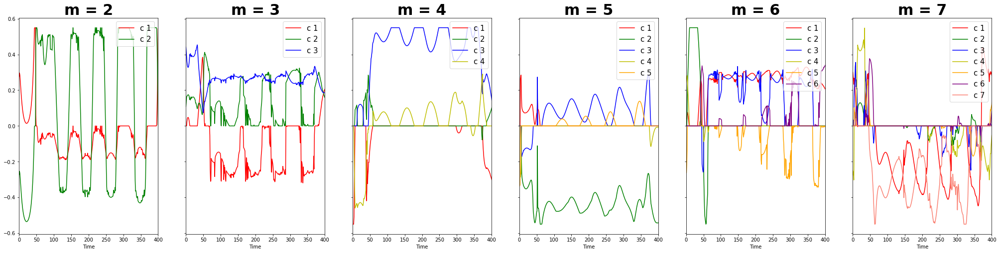

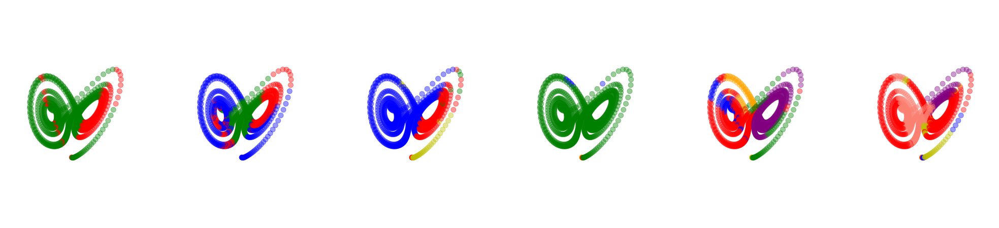

In [ ]:
num_sub_parh = results_path  + r'/num_sub_lorenz'

max_dyplay = 400
num_subs = [2,3,4,5,6,7]
fig,axs0 = plt.subplots(1,len(num_subs), figsize = (35,8),sharey = 'row')
fig,axs1 = plt.subplots(1,len(num_subs), figsize = (35,8),sharey = 'row',subplot_kw={'projection':'3d'})
for sub_n, sub in enumerate(num_subs):
    file_name = num_sub_parh + r'/lorenz_%gsub0_55regspgl1_iters10.npy'%sub
    iter_results = np.load(file_name,allow_pickle=True).item()
    F = iter_results['F']
    coefficients = iter_results['coefficients']   
    latent_dyn = iter_results['latent_dyn']
    cur_reco = create_reco(latent_dyn,coefficients, F)
    [axs0[sub_n].plot(coefficients[i,:], c=c[i]) for i in range(coefficients.shape[0])]
    axs0[sub_n].legend(['c %g'%(i+1) for i in range(coefficients.shape[0])] ,loc = 'upper right',prop = {'size':15})
    visualize_dyn(latent_dyn, coefficients=coefficients, color_by_dominant=True, colors_dyns=np.array(c), marker_size = 100,ax = axs1[sub_n])
    axs0[sub_n].set_title('m = %g'%sub, fontsize = 30, fontweight = 'bold')
    axs0[sub_n].set_xlim([0,max_dyplay])

    axs0[sub_n].set_xlabel('Time')
    axs1[sub_n].set_ylabel('Coefficients')


## ***C. elegans* data**
### Using brain-wide calcium imaging of *Caenorhabditis elegans*, as described in [1,2].

[1] Kato, S., Kaplan, H. S., Schrödel, T., Skora, S., Lindsay, T. H., Yemini, E., Lockery, S., & Zimmer, M. (2015). Global brain dynamics embed the motor command sequence of Caenorhabditis elegans. Cell, 163(3), 656–669. https://doi.org/10.1016/j.cell.2015.09.034

[2] Emmons, S.W., Yemini, E., & Zimmer, M. (2021). Methods for analyzing neuronal structure and activity in Caenorhabditis elegans. Genetics.

Open source data obtained from [3].



### Data description

The data shown below are from the first worm (out of 7) in the wild type case that received stimulation, with 2198 timepoints (733 seconds) and 107 channels (T by N). Some of the 107 channels correspond to at least on labelled neuron. Behavioral states (4 total in the stim case) were discretely labelled with one active at each timepoint. This motivated the choice of 4 discrete states $\hat{z}$ for rSLDS. However, we chose to learn 10 elements of F for dLDS because the additional expressability provided some insights about behavior in time snippets where rSLDS did not perform consistently. Future experimentation would include a more comprehensive hyperparameter search for dLDS.

### dLDS parameters

10 learned continuous latent states $\hat{x}$

10 learned elements of F

10 learned coefficients c

0.1 regularization on $\hat{x}$

0.01 regularization on coefficients c

1e-3 tolerance

3000 iterations

### rSLDS parameters
10 learned continuous latent states $\hat{x}$

4 learned discrete states $\hat{z}$


### Loading *C. elegans* results by dLDS (our model) and by the reference (rSLDS)

In [ ]:
import scipy
import io
import scipy.io

In [ ]:
mat_c_elegans_rslds = scipy.io.loadmat(results_path  + r'/Worm1_WT_Stim_Zhat_discretestates.mat')
mat_c_elegans_ground_truth = scipy.io.loadmat(results_path  +r'/Worm1_WT_Stim.mat')
coefficients_rslds = mat_c_elegans_rslds['discretestatesWorm1S'].T

iter_results = np.load(results_path  + r'/c_elegans_dlds_results.npy',allow_pickle=True).item()
F = iter_results['F']
coefficients = iter_results['coefficients']   
D = iter_results['D']

Heatmap description of the data - neural recordings over time 

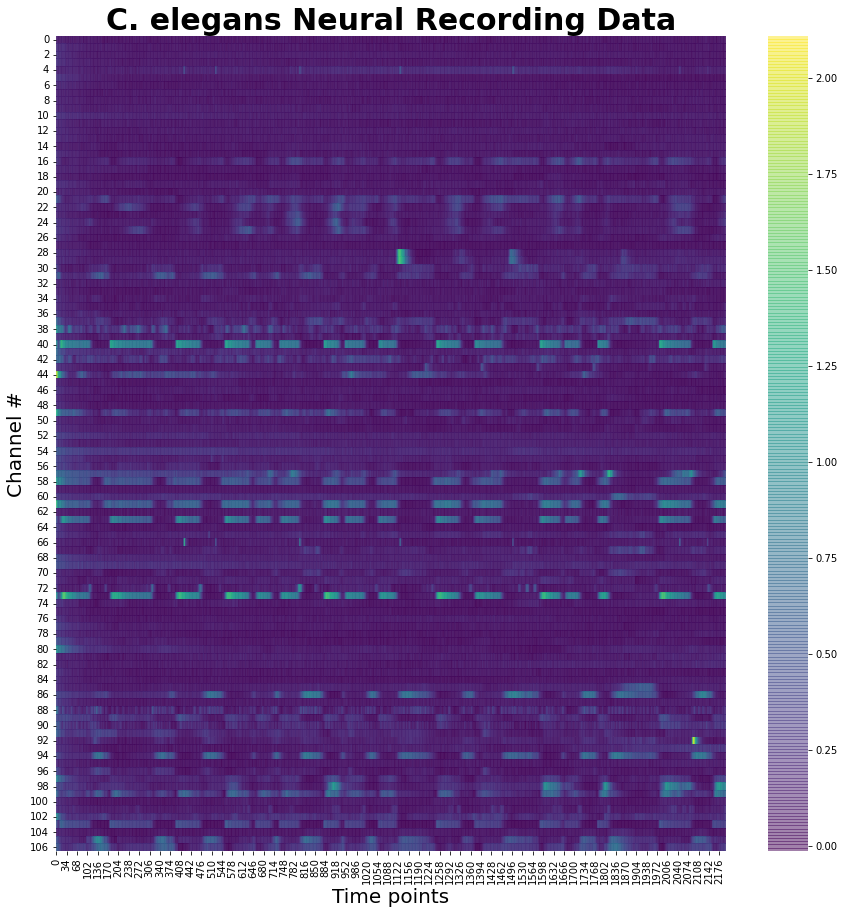

In [ ]:
fig, ax = plt.subplots(figsize = (15,15))
h = sns.heatmap(mat_c_elegans_ground_truth['dFFTurned'],cmap ='viridis', alpha = 0.5 , ax = ax);
ax.set_title('C. elegans Neural Recording Data', fontsize = fsize*1.5, fontweight = 'bold');
ax.set_xlabel('Time points', fontsize = fsize)
ax.set_ylabel('Channel #', fontsize = fsize);
# ax.set_yticklabels(np.arange(np.shape(D)[0])+1);


Coefficients as obtained in our model vs discrete states as obtained by the reference

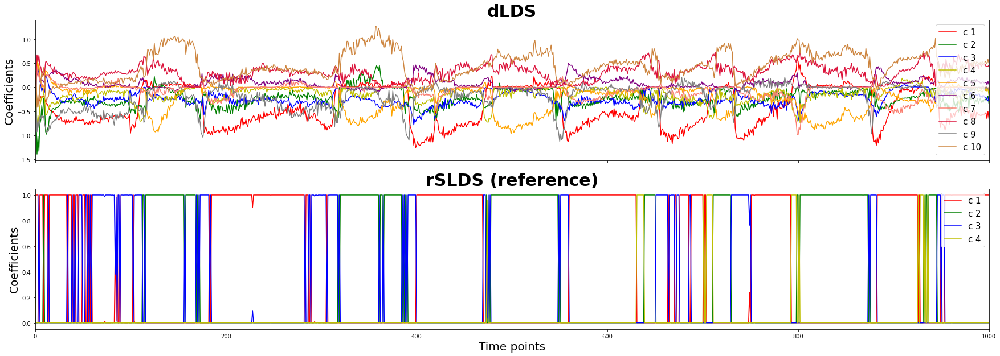

In [ ]:
max_time_display = 1000
fig,axs = plt.subplots(2,1,figsize = (30,10) , sharex = True)
[axs[0].plot(coefficients[i,:], c = c[i]) for  i in range(coefficients.shape[0])]
[axs[1].plot(coefficients_rslds[i,:], c = c[i]) for  i in range(coefficients_rslds.shape[0])]

axs[0].legend(['c %g'%(i+1) for i in range(coefficients.shape[0])], prop = {'size':15}, loc = 'upper right')
axs[1].legend(['c %g'%(i+1) for i in range(coefficients_rslds.shape[0])], prop = {'size':15}, loc = 'upper right')
titles = ['dLDS', 'rSLDS (reference)']
[axs[i].set_title(title, fontsize = fsize*1.5, fontweight = 'bold') for i, title in enumerate(titles)]
axs[1].set_xlabel('Time points', fontsize = fsize)
[ax.set_ylabel('Coefficients', fontsize = fsize) for ax in axs]
[ax.set_xlim([0,max_time_display ]) for ax in axs];

Text(0.5, 0.98, 'Coefficients space, both for dLDS (left) and for rsLDS (right)')

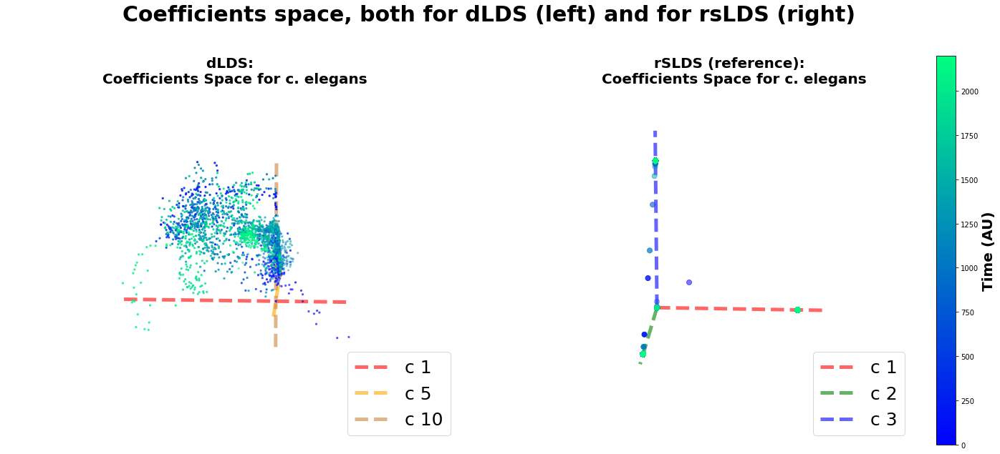

In [ ]:
fig, axs =  plt.subplots(1,2,figsize = (25,10),subplot_kw={'projection':'3d'})

"""
dLDS
"""
coefficients_n = coefficients[[0,4,9], :]
h = axs[0].scatter(coefficients_n[0,:], coefficients_n[1,:], coefficients_n[2,:], c = np.arange(coefficients_n.shape[1]), cmap = cmap, s = 5)
zax = np.arange(coefficients_n.shape[1])

axs[0].xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs[0].yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs[0].zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs[0].grid(False)
axs[0].set_axis_off()
axs[0].plot([0,0],[np.min(coefficients_n[1,:]),np.max(coefficients_n[1,:])],[0,0], color = c[0], ls = '--', alpha = 0.6,lw = 5,label = 'c 1')
axs[0].plot([np.min(coefficients_n[0,:]),np.nanmax(coefficients_n[0,:])],[0,0],[0,0], color = c[4], ls = '--', alpha = 0.6, lw = 5, label = 'c 5')
axs[0].plot([0,0],[0,0],[np.min(coefficients_n[2,:]),np.nanmax(coefficients_n[2,:])], color = c[9], ls = '--', alpha = 0.6, lw = 5, label = 'c 10')

axs[0].legend(prop = {'size':25},loc = 'lower right')

add_labels(axs[0],zlabel = 'c 1', zlabel_params={'fontsize': fsize, 'fontweight':'bold'},
           ylabel_params={'fontsize': fsize, 'fontweight':'bold'}, ylabel = 'c 5',
           xlabel_params={'fontsize': fsize, 'fontweight':'bold'}, xlabel = 'c 10',
           title_params={'fontsize': fsize, 'fontweight':'bold'}, title = 'dLDS: \n Coefficients Space for c. elegans')
"""
rsLDS
"""
coefficients_n = coefficients_rslds[[0,1,2], :]
h = axs[1].scatter(coefficients_n[0,:], coefficients_n[1,:], coefficients_n[2,:], c = np.arange(coefficients_n.shape[1]), cmap = cmap, s = 50)
zax = np.arange(coefficients_n.shape[1])

axs[1].xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs[1].yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs[1].zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
axs[1].grid(False)
axs[1].set_axis_off()
axs[1].plot([0,0],[np.min(coefficients_n[1,:]),1.2*np.max(coefficients_n[1,:])],[0,0], color = c[0], ls = '--', alpha = 0.6,lw = 5,label = 'c 1')
axs[1].plot([np.min(coefficients_n[0,:]),1.2*np.nanmax(coefficients_n[0,:])],[0,0],[0,0], color = c[1], ls = '--', alpha = 0.6, lw = 5, label = 'c 2')
axs[1].plot([0,0],[0,0],[np.min(coefficients_n[2,:]),1.2*np.nanmax(coefficients_n[2,:])], color = c[2], ls = '--', alpha = 0.6, lw = 5, label = 'c 3')

axs[1].legend(prop = {'size':25},loc = 'lower right')

add_labels(axs[1],zlabel = 'c 1', zlabel_params={'fontsize': fsize, 'fontweight':'bold'},
           ylabel_params={'fontsize': fsize, 'fontweight':'bold'}, ylabel = 'c 5',
           xlabel_params={'fontsize': fsize, 'fontweight':'bold'}, xlabel = 'c 10',
           title_params={'fontsize': fsize, 'fontweight':'bold'}, title = 'rSLDS (reference): \n Coefficients Space for c. elegans')


cbar = fig.colorbar(h)
cbar.ax.set_ylabel('Time (AU)', rotation =90, fontsize = fsize, fontweight = 'bold')
[ax.view_init(elev=15, azim=3) for ax in axs]
fig.suptitle('Coefficients space, both for dLDS (left) and for rsLDS (right)',fontsize = fsize*1.5,fontweight = 'bold')

### Characterize D
$y = Dx$, as in equation $1$ in the paper, where $y$ is the data, $x$ is the latent variable.

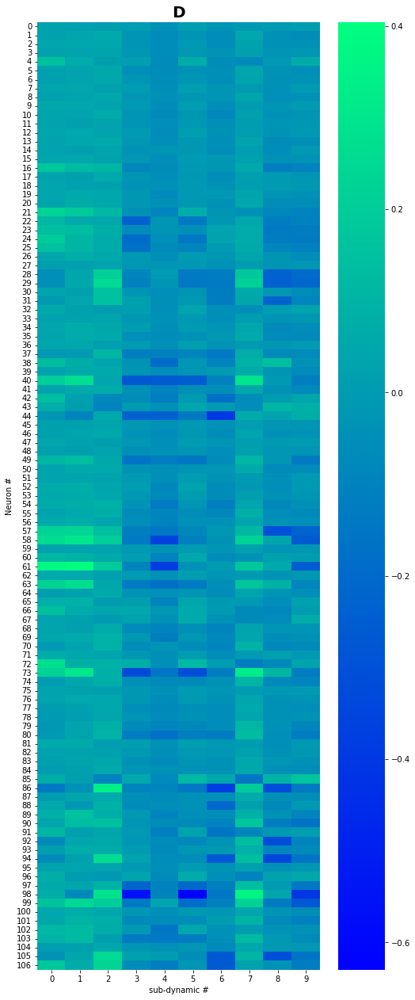

In [ ]:
fig, ax = plt.subplots(figsize = (8,22))
sns.heatmap(D, annot = False, cmap =cmap)
ax.set_xlabel('sub-dynamic #')
ax.set_ylabel('Neuron #')
ax.set_title('D', fontsize =fsize, fontweight ='bold');
# ax.set_yticklabels(np.arange(np.shape(D)[0])+1);

## Find networks of neurns as defined by the columns of D
### (from $y = Dx$, equation 1 in the paper)
Channels (some of which correspond to labelled neurons) whose weights are high in each column, might form a network. The numbers on the nodes refer to the channel number, starting from 0. 

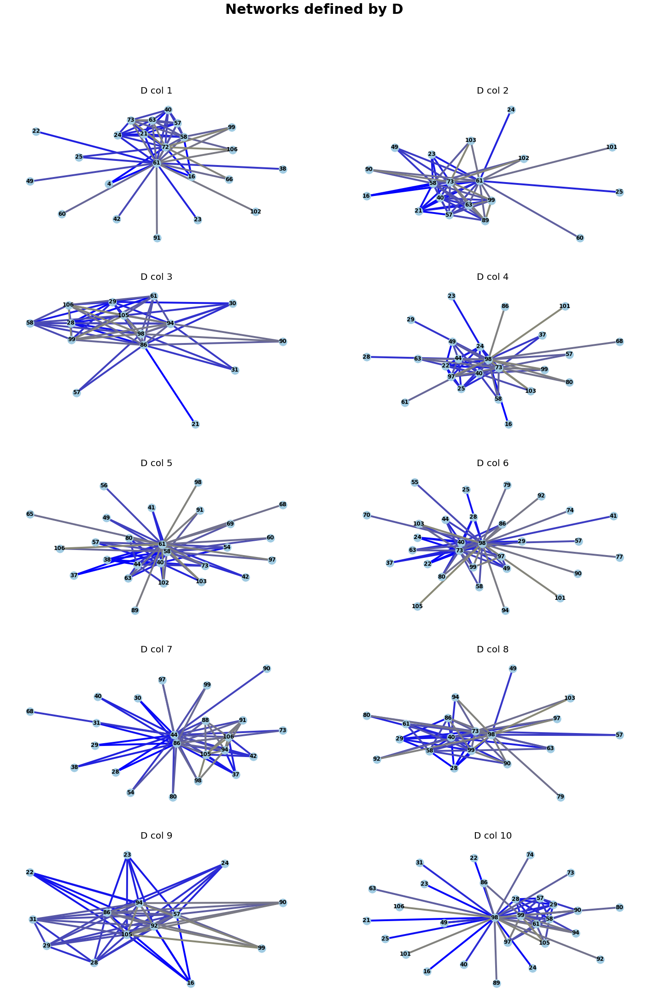

In [ ]:
import networkx as nx
fig,ax = plt.subplots(int(D.shape[1]/2),2,figsize = (25,int(D.shape[1]/2)*7))
ax = ax.flatten()
colors = np.vstack([np.linspace(0,1,D.shape[0]),np.linspace(0,1,D.shape[0]),1-np.linspace(0,1,D.shape[0])]).T
options = {
    "node_color": "#A0CBE2",
    "edge_color": colors,
    "width": 4,
    "edge_cmap": plt.cm.Blues,
    }
for col in range(D.shape[1])  :
  base_graph = D[:,col].reshape((-1,1)) @ D[:,col].reshape((1,-1))
  np.fill_diagonal(base_graph, 0)
  base_graph[base_graph < np.percentile(base_graph.flatten(), 99)] = 0
  G = nx.Graph(base_graph)
  G.remove_nodes_from(list(nx.isolates(G)))
  pos = nx.spring_layout(G, seed = 50)
  nx.draw(G, pos = pos, with_labels=True, font_weight='bold', ax = ax[col], **options)
  ax[col].set_title('D col %g'%(col+1), fontsize = fsize)
fig.suptitle('Networks defined by D', fontsize =fsize*1.5, fontweight = 'bold')
fig.subplots_adjust(top=0.9, wspace=0.1)

### Heatmaps of the dictionary elements ($f_i$) obtained by our model for the *C. elegans* data 

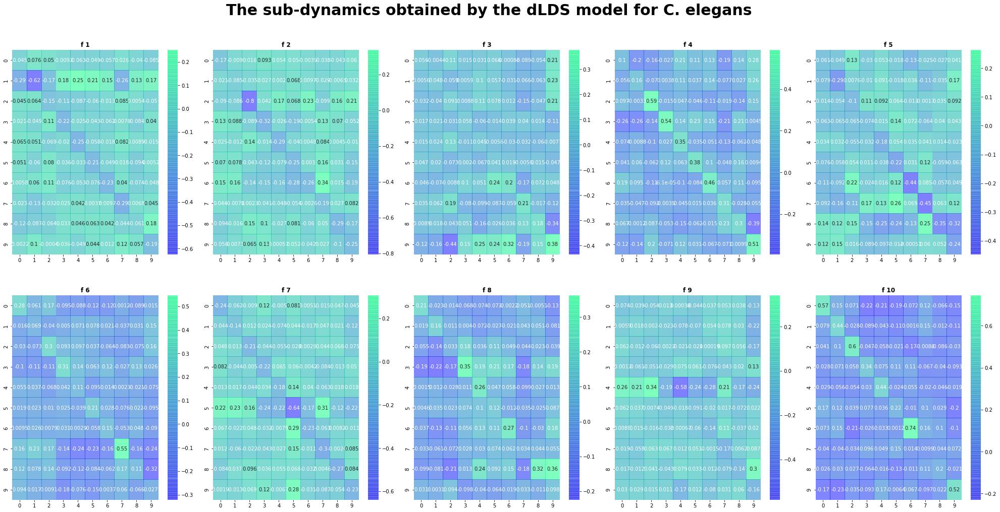

In [ ]:
fig,axs = plt.subplots(2,int(len(F)/2),figsize = (35,16))
axs = axs.flatten()
[sns.heatmap(f,annot = True,ax = axs[i],cmap= cmap,alpha = 0.5) for i,f in enumerate(F)]
[ax.set_title('f %s'%str(i+1), fontweight = 'bold') for i , ax in enumerate(axs)];
fig.suptitle('The sub-dynamics obtained by the dLDS model for C. elegans', fontsize =fsize*1.5, fontweight = 'bold')
fig.subplots_adjust(top=0.9, wspace=0.1)
